# Data Mining Lab 2
In this lab session we will focus on the use of Neural Word Embeddings and exploring some basic open source LLMs' applications to data.

## Table of Contents
1. Data preparation
2. Feature engineering
3. Model
4. Results evaluation
5. Other things you could try
6. Deep Learning
7. Word to Vector
8. Clustering
9. High-dimension Visualization
10. Large Language Models (LLMs)


### Necessary Library Requirements:

#### Same as Lab1 except PAMI:
- [Jupyter](http://jupyter.org/) (Strongly recommended but not required)
    - Install via `pip3 install jupyter` and use `jupyter notebook` in terminal to run
- [Scikit Learn](http://scikit-learn.org/stable/index.html)
    - Install via `pip3 install scikit-learn` from a terminal
- [Pandas](http://pandas.pydata.org/)
    - Install via `pip3 install pandas` from a terminal
- [Numpy](http://www.numpy.org/)
    - Install via `pip3 install numpy` from a terminal
- [Matplotlib](https://matplotlib.org/)
    - Install via `pip3 install maplotlib` from a terminal
- [Plotly](https://plot.ly/)
    - Install via `pip3 install plotly` from a terminal
- [Seaborn](https://seaborn.pydata.org/)
    - Install via `pip3 install seaborn`
- [NLTK](http://www.nltk.org/)
    - Install via `pip3 install nltk` from a terminal
- [UMAP](https://umap-learn.readthedocs.io/en/latest/)
    - Install via `pip3 install umap-learn` from a terminal
    

#### New Libraries to install:
- [Gensim](https://pypi.org/project/gensim/)
    - Install via `pip3 install gensim`

- [tensorflow](https://www.tensorflow.org/)
    - Install via `pip3 install tensorflow`
    - Also install `pip3 install tensorflow-hub`

- [Keras](https://keras.io/)
    - Install via `pip3 install keras`

- [Ollama](https://ollama.com)
    - Install via `pip3 install ollama`

- [langchain](https://www.langchain.com)
    - Install via `pip3 install langchain`
    - Also install `pip3 install langchain_community`
    - Also install `pip3 install langchain_core`
    
- [beautifulsoup4](https://pypi.org/project/beautifulsoup4/)
    - Install via `pip3 install beautifulsoup4`
    
- [chromadb](https://www.trychroma.com)
    - Install via `pip3 install chromadb`
    
- [gradio](https://www.gradio.app)
    - Install via `pip3 install gradio`
    
#### Open-source LLMs to install:
- ollama run llama3.2
- ollama run llama3.2:1b  (optional if the first one is too big)
- ollama run llava-phi3

---
## Introduction

**Dataset:** [SemEval 2017 Task](https://competitions.codalab.org/competitions/16380)

**Task:** Classify text data into 4 different emotions using word embeddings and other deep information retrieval approaches.

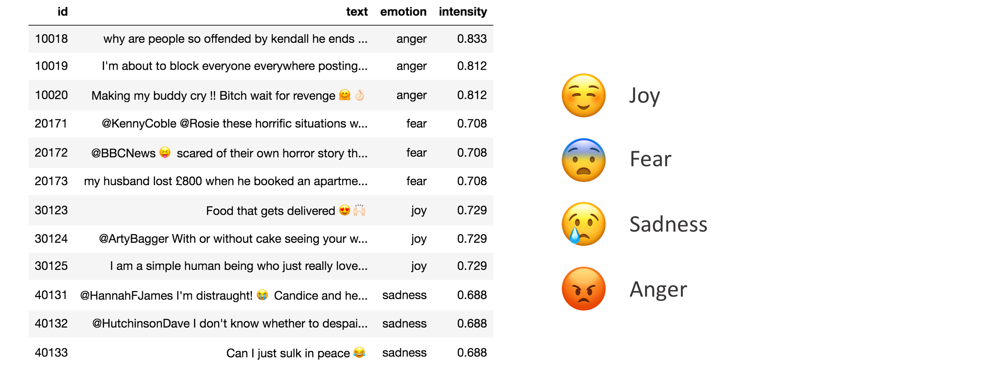

---
## 1. Data Preparation

Before beggining the lab, please make sure to download the [Google News Dataset](https://drive.google.com/file/d/0B7XkCwpI5KDYNlNUTTlSS21pQmM/edit) and place it in a folder named "GoogleNews" in the same directory as this file.

## 1.1 Load data

We start by loading the csv files into a single pandas dataframe for training and one for testing.

In [5]:
import pandas as pd

### training data
anger_train = pd.read_csv("data/semeval/train/anger-ratings-0to1.train.txt",
                         sep="\t", header=None,names=["id", "text", "emotion", "intensity"])
sadness_train = pd.read_csv("data/semeval/train/sadness-ratings-0to1.train.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
fear_train = pd.read_csv("data/semeval/train/fear-ratings-0to1.train.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
joy_train = pd.read_csv("data/semeval/train/joy-ratings-0to1.train.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])

In [6]:
# combine 4 sub-dataset
train_df = pd.concat([anger_train, fear_train, joy_train, sadness_train], ignore_index=True)

In [7]:
### testing data
anger_test = pd.read_csv("data/semeval/dev/anger-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
sadness_test = pd.read_csv("data/semeval/dev/sadness-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
fear_test = pd.read_csv("data/semeval/dev/fear-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
joy_test = pd.read_csv("data/semeval/dev/joy-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])

# combine 4 sub-dataset
test_df = pd.concat([anger_test, fear_test, joy_test, sadness_test], ignore_index=True)
train_df.head()

,id,text,emotion,intensity
0,10000,How the fu*k! Who the heck! moved my fridge!.....,anger,0.938
1,10001,So my Indian Uber driver just called someone t...,anger,0.896
2,10002,@DPD_UK I asked for my parcel to be delivered ...,anger,0.896
3,10003,so ef whichever butt wipe pulled the fire alar...,anger,0.896
4,10004,Don't join @BTCare they put the phone down on ...,anger,0.896


In [8]:
# shuffle dataset
train_df = train_df.sample(frac=1)
test_df = test_df.sample(frac=1)

In [9]:
print("Shape of Training df: ", train_df.shape)
print("Shape of Testing df: ", test_df.shape)

Shape of Training df:  (3613, 4)
Shape of Testing df:  (347, 4)


---
### ** >>> Exercise 1 (Take home): **  
Plot word frequency for Top 30 words in both train and test dataset. (Hint: refer to DM lab 1)


In [10]:
# Answer here
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
import re

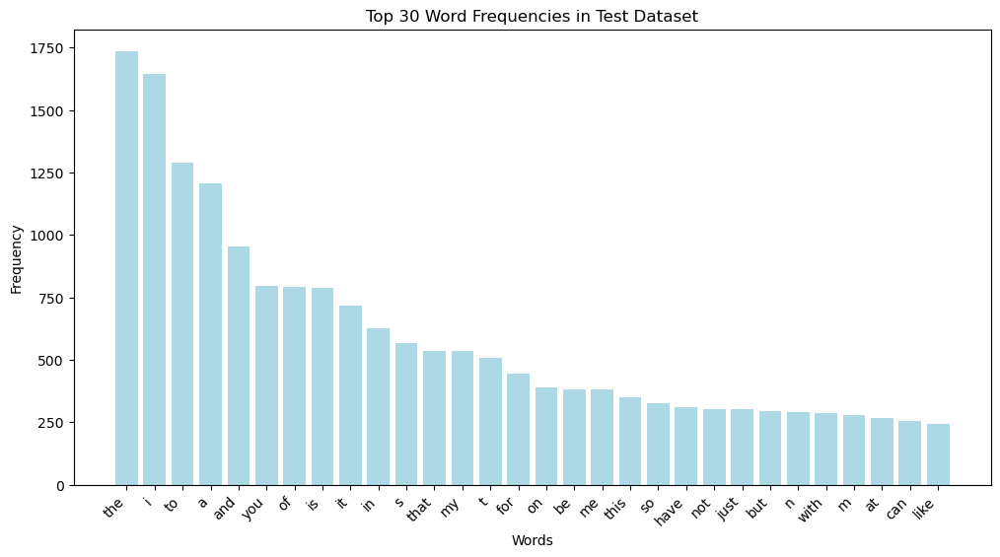

In [11]:
## train dataset
def preprocess_and_count(dataset):
    all_words = []
    for text in dataset['text']:
        if not text or not isinstance(text, str): 
            continue
        words = re.findall(r'\b\w+\b', text.lower())
        all_words.extend(words)
    return Counter(all_words)

word_count = preprocess_and_count(train_df)

def plot_top_words(word_count):
    top_words = word_count.most_common(30)
    if not top_words: 
        print("No words found in the dataset!")
        return
    
    words, counts = zip(*top_words)
    plt.figure(figsize=(12, 6))
    plt.bar(words, counts, color='lightblue')
    plt.xticks(rotation=45, ha='right')
    plt.title('Top 30 Word Frequencies in Test Dataset')
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.show()

plot_top_words(word_count)

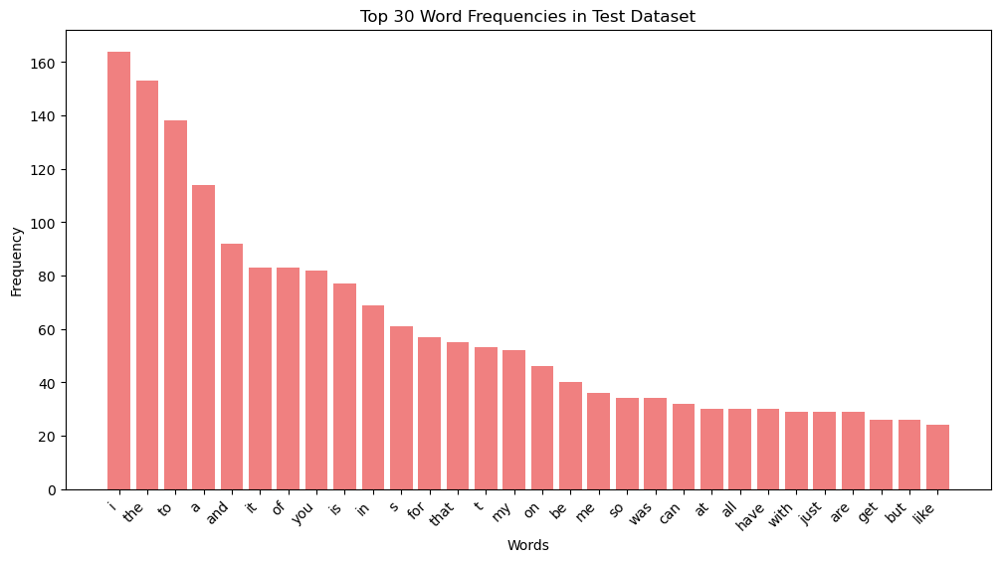

In [12]:
## test dataset
def preprocess_and_count(dataset):
    all_words = []
    for text in dataset['text']:
        if not text or not isinstance(text, str): 
            continue
        words = re.findall(r'\b\w+\b', text.lower())
        all_words.extend(words)
    return Counter(all_words)

word_count = preprocess_and_count(test_df)

def plot_top_words(word_count):
    top_words = word_count.most_common(30)
    if not top_words: 
        print("No words found in the dataset!")
        return
    
    words, counts = zip(*top_words)
    plt.figure(figsize=(12, 6))
    plt.bar(words, counts, color='lightcoral')
    plt.xticks(rotation=45, ha='right')
    plt.title('Top 30 Word Frequencies in Test Dataset')
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.show()

plot_top_words(word_count)

---
### 1.2 Save data

We will save our data in Pickle format. The pickle module implements binary protocols for serializing and de-serializing a Python object structure.   
  
Some advantages for using pickle structure:  
* Because it stores the attribute type, it's more convenient for cross-platform use.  
* When your data is huge, it could use less space to store also consume less loading time.   

In [13]:
## save to pickle file
train_df.to_pickle("train_df.pkl") 
test_df.to_pickle("test_df.pkl")

In [14]:
import pandas as pd

## load a pickle file
train_df = pd.read_pickle("train_df.pkl")
test_df = pd.read_pickle("test_df.pkl")

For more information: https://reurl.cc/0Dzqx

---
### 1.3 Exploratory data analysis (EDA)

Again, before getting our hands dirty, we need to explore a little bit and understand the data we're dealing with.

In [15]:
# group to find distribution
train_df.groupby(['emotion']).count()['text']

emotion
anger       857
fear       1147
joy         823
sadness     786
Name: text, dtype: int64

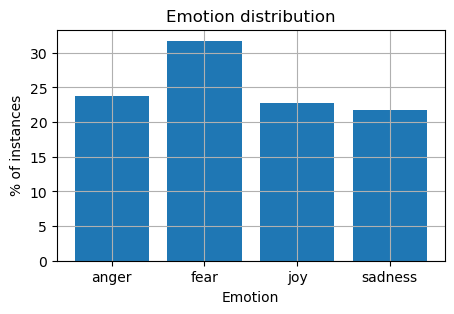

In [16]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

# the histogram of the data
labels = train_df['emotion'].unique()
post_total = len(train_df)
df1 = train_df.groupby(['emotion']).count()['text']
df1 = df1.apply(lambda x: round(x*100/post_total,3))

#plot
fig, ax = plt.subplots(figsize=(5,3))
plt.bar(df1.index,df1.values)

#arrange
plt.ylabel('% of instances')
plt.xlabel('Emotion')
plt.title('Emotion distribution')
plt.grid(True)
plt.show()

---

## 2. Feature engineering
### Using Bag of Words
Using scikit-learn ```CountVectorizer``` perform word frequency and use these as features to train a model.  
http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html

In [17]:
from sklearn.feature_extraction.text import CountVectorizer

In [18]:
# build analyzers (bag-of-words)
BOW_vectorizer = CountVectorizer() 

In [19]:
# 1. Learn a vocabulary dictionary of all tokens in the raw documents.
BOW_vectorizer.fit(train_df['text'])

# 2. Transform documents to document-term matrix.
train_data_BOW_features = BOW_vectorizer.transform(train_df['text'])
test_data_BOW_features = BOW_vectorizer.transform(test_df['text'])

In [20]:
# check the result
train_data_BOW_features

<3613x10115 sparse matrix of type '<class 'numpy.int64'>'
	with 51467 stored elements in Compressed Sparse Row format>

In [21]:
type(train_data_BOW_features)

scipy.sparse._csr.csr_matrix

In [22]:
# add .toarray() to show
train_data_BOW_features.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [23]:
# check the dimension
train_data_BOW_features.shape

(3613, 10115)

In [24]:
# observe some feature names
feature_names = BOW_vectorizer.get_feature_names_out()
feature_names[100:110]

array(['2k17', '2much', '2nd', '30', '300', '301', '30am', '30pm', '30s',
       '31'], dtype=object)

The embedding is done. We can technically feed this into our model. However, depending on the embedding technique you use and your model, your accuracy might not be as high, because:

* curse of dimensionality  (we have 10,115 dimension now)
* some important features are ignored (for example, some models using emoticons yeld better performance than counterparts)

In [25]:
"😂" in feature_names

False

Let's try using another tokenizer below.

In [26]:
import nltk
nltk.download('punkt_tab')  

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\Capybara\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [27]:
import nltk
# build analyzers (bag-of-words)
BOW_500 = CountVectorizer(max_features=500, tokenizer=nltk.word_tokenize) 

# apply analyzer to training data
BOW_500.fit(train_df['text'])

train_data_BOW_features_500 = BOW_500.transform(train_df['text'])

## check dimension
train_data_BOW_features_500.shape

C:\Users\Capybara\anaconda3\envs\NTUclass\lib\site-packages\sklearn\feature_extraction\text.py:521: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


(3613, 500)

In [28]:
train_data_BOW_features_500.toarray()

array([[0, 2, 0, ..., 0, 0, 0],
       [0, 5, 0, ..., 0, 0, 0],
       [0, 2, 0, ..., 0, 0, 0],
       ...,
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [29]:
# observe some feature names
feature_names_500 = BOW_500.get_feature_names_out()
feature_names_500[100:110]

array(['change', 'cheer', 'cheerful', 'cheerfully', 'cheering', 'cheery',
       'come', 'comes', 'could', 'country'], dtype=object)

In [30]:
"😂" in feature_names_500

True

---
### ** >>> Exercise 2 (Take home): **  
Generate an embedding using the TF-IDF vectorizer instead of th BOW one with 1000 features and show the feature names for features [100:110].

In [31]:
# Answer here
from sklearn.feature_extraction.text import TfidfVectorizer

corpus = train_df['text'].dropna()  
tfidf_vectorizer = TfidfVectorizer(max_features=1000) 


tfidf_matrix = tfidf_vectorizer.fit_transform(corpus) 
feature_names = tfidf_vectorizer.get_feature_names_out() 

# 列出特徵名稱
selected_features = feature_names[100:110]
print("Selected Features [100:110]:", selected_features)


Selected Features [100:110]: ['bitter' 'black' 'blacks' 'blame' 'blessed' 'blood' 'bloody' 'blues'
 'body' 'boiling']


---
## 3. Model
### 3.1 Decision Trees
Using scikit-learn ```DecisionTreeClassifier``` performs word frequency and uses these as features to train a model.  
http://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier

In [32]:
from sklearn.tree import DecisionTreeClassifier

# for a classificaiton problem, you need to provide both training & testing data
X_train = BOW_500.transform(train_df['text'])
y_train = train_df['emotion']

X_test = BOW_500.transform(test_df['text'])
y_test = test_df['emotion']

## take a look at data dimension is a good habit  :)
print('X_train.shape: ', X_train.shape)
print('y_train.shape: ', y_train.shape)
print('X_test.shape: ', X_test.shape)
print('y_test.shape: ', y_test.shape)

X_train.shape:  (3613, 500)
y_train.shape:  (3613,)
X_test.shape:  (347, 500)
y_test.shape:  (347,)


In [33]:
## build DecisionTree model
DT_model = DecisionTreeClassifier(random_state=1)

## training!
DT_model = DT_model.fit(X_train, y_train)

## predict!
y_train_pred = DT_model.predict(X_train)
y_test_pred = DT_model.predict(X_test)

## so we get the pred result
y_test_pred[:10]

array(['sadness', 'joy', 'joy', 'joy', 'fear', 'anger', 'fear', 'anger',
       'fear', 'fear'], dtype=object)

---
## 4. Results Evaluation

Now we will check the results of our model's performance

In [34]:
## accuracy
from sklearn.metrics import accuracy_score

acc_train = accuracy_score(y_true=y_train, y_pred=y_train_pred)
acc_test = accuracy_score(y_true=y_test, y_pred=y_test_pred)

print('training accuracy: {}'.format(round(acc_train, 2)))
print('testing accuracy: {}'.format(round(acc_test, 2)))


training accuracy: 0.99
testing accuracy: 0.68


In [35]:
## precision, recall, f1-score,
from sklearn.metrics import classification_report

print(classification_report(y_true=y_test, y_pred=y_test_pred))

              precision    recall  f1-score   support

       anger       0.66      0.68      0.67        84
        fear       0.66      0.69      0.67       110
         joy       0.72      0.71      0.71        79
     sadness       0.70      0.64      0.67        74

    accuracy                           0.68       347
   macro avg       0.68      0.68      0.68       347
weighted avg       0.68      0.68      0.68       347



In [36]:
## check by confusion matrix
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true=y_test, y_pred=y_test_pred) 
print(cm)

[[57 18  6  3]
 [16 76  9  9]
 [ 6  9 56  8]
 [ 7 13  7 47]]


In [37]:
# Funciton for visualizing confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import itertools

def plot_confusion_matrix(cm, classes, title='Confusion matrix',
                          cmap=sns.cubehelix_palette(as_cmap=True)):
    """
    This function is modified from: 
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
    """
    classes.sort()
    tick_marks = np.arange(len(classes))    
    
    fig, ax = plt.subplots(figsize=(5,5))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           xticklabels = classes,
           yticklabels = classes,
           title = title,
           xlabel = 'Predicted label',
           ylabel = 'True label')

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")
    ylim_top = len(classes) - 0.5
    plt.ylim([ylim_top, -.5])
    plt.tight_layout()
    plt.show()

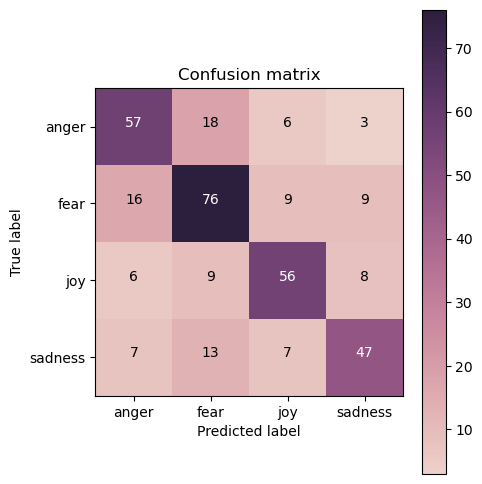

In [38]:
# plot your confusion matrix
my_tags = ['anger', 'fear', 'joy', 'sadness']
plot_confusion_matrix(cm, classes=my_tags, title='Confusion matrix')

---
### ** >>> Exercise 3 (Take home): **  
Can you interpret the results above? What do they mean?

#### <font color=blue><b>Answer</b></font> 
- Classification Report
  1. **Precision:** Represents the proportion of samples predicted to belong to a certain class that actually belong to that class.
  > For example, the precision for `anger` is 0.66, meaning 66% of the samples predicted as `anger` are correct.
  
  2. **Recall:** Represents the proportion of samples that actually belong to a certain class that are correctly predicted as that class.
  > For example, the recall for `fear` is 0.69, meaning 69% of the samples that are truly `fear` are correctly identified.

  3. **F1-Score:** The harmonic mean of precision and recall, providing a balanced evaluation of the model's performance.
  4. **Support:** The number of samples in each class, which impacts the calculation of these metrics.
  
-  Confusion Matrix
    - Rows represent actual labels, and columns represent predicted labels.
    - The numbers on the diagonal (e.g., 57, 76, 56, 47) indicate the number of correctly classified samples.
    - The numbers off the diagonal represent misclassification cases. For example:
      > 18 samples of anger were misclassified as fear.
      > 
      > 13 samples of sadness were misclassified as fear.
- Visualization of the Confusion Matrix 
  - Darker colors indicate higher numbers.



---
### ** >>> Exercise 4 (Take home): **  
Build a model using a ```Naive Bayes``` model and train it. What are the testing results? 

*Reference*: https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html

In [39]:
# Answer here

from sklearn.naive_bayes import MultinomialNB

## build Naive Bayes model
NB_model = MultinomialNB()

## training
NB_model = NB_model.fit(X_train, y_train)

## predict
y_train_pred_NB = NB_model.predict(X_train)
y_test_pred_NB = NB_model.predict(X_test)

## the pred result
y_test_pred[:10]


array(['sadness', 'joy', 'joy', 'joy', 'fear', 'anger', 'fear', 'anger',
       'fear', 'fear'], dtype=object)

In [40]:
## accuracy
from sklearn.metrics import accuracy_score

acc_train_NB = accuracy_score(y_true=y_train, y_pred=y_train_pred_NB)
acc_test_NB = accuracy_score(y_true=y_test, y_pred=y_test_pred_NB)

print('training accuracy: {}'.format(round(acc_train_NB, 2)))
print('testing accuracy: {}'.format(round(acc_test_NB, 2)))


training accuracy: 0.79
testing accuracy: 0.7


In [41]:
print(classification_report(y_true=y_test, y_pred=y_test_pred_NB))

              precision    recall  f1-score   support

       anger       0.63      0.65      0.64        84
        fear       0.73      0.77      0.75       110
         joy       0.78      0.71      0.74        79
     sadness       0.64      0.62      0.63        74

    accuracy                           0.70       347
   macro avg       0.70      0.69      0.69       347
weighted avg       0.70      0.70      0.70       347



In [42]:
## check by confusion matrix
from sklearn.metrics import confusion_matrix

cm_NB = confusion_matrix(y_true=y_test, y_pred=y_test_pred_NB) 
print(cm_NB)

[[55 15  5  9]
 [ 9 85  5 11]
 [11  6 56  6]
 [12 10  6 46]]


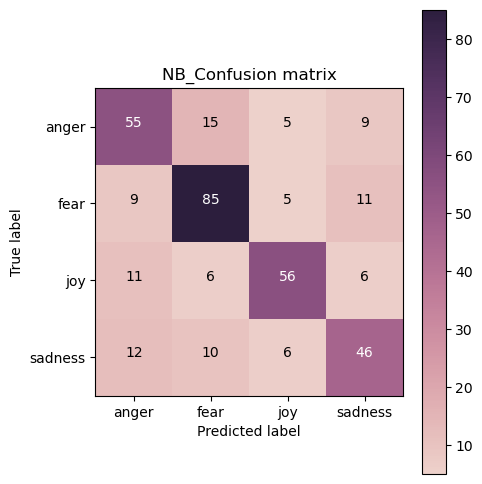

In [43]:
my_tags = ['anger', 'fear', 'joy', 'sadness']
plot_confusion_matrix(cm_NB, classes=my_tags, title='NB_Confusion matrix')

---
### ** >>> Exercise 5 (Take home): **  

How do the results from the Naive Bayes model and the Decision Tree model compare? How do you interpret these differences? Use the theoretical background covered in class to try and explain these differences.

#### Result analysis
1. <b>Accuracy</b>
> The Naive Bayes model has an accuracy of 0.70, while the Decision Tree model has an accuracy of 0.68. This indicates that the Naive Bayes model slightly outperforms the Decision Tree model in terms of overall accuracy.

2. <b>Precision, Recall, and F1-score</b>
    - For the anger category, the Naive Bayes model has a precision of 0.63, recall of 0.65, and F1-score of 0.64, whereas the Decision Tree model has a precision of 0.66, recall of 0.68, and F1-score of 0.67.
    - For the fear category, the Naive Bayes model has a precision of 0.73, recall of 0.77, and F1-score of 0.75, while the Decision Tree model has a precision of 0.66, recall of 0.69, and F1-score of 0.67.
    - For the joy category, the Naive Bayes model has a precision of 0.78, recall of 0.71, and F1-score of 0.74, compared to the Decision Tree model's precision of 0.72, recall of 0.71, and F1-score of 0.71.
    - For the sadness category, the Naive Bayes model has a precision of 0.64, recall of 0.62, and F1-score of 0.63, while the Decision Tree model has a precision of 0.70, recall of 0.64, and F1-score of 0.67.

#### Model Background
- Naive Bayes
  > This model assumes feature independence, which can be a strong assumption and may not hold in real-world data. However, it is often effective for text classification tasks due to its simplicity and efficiency.
- Decision Tree
  > This model does not assume feature independence and can capture complex relationships in the data. However, it can be prone to overfitting, especially with small datasets.


---

## 5. Other things you can try

Thus, there are several things you can try that will affect your results. In order to yield better results, you can experiment by: 
- Trying different features (Feature engineering)e.g Word2Vec, PCA, LDA, FastText, Clustering
- Trying different models
- Analyzing your results and interpret them to improve your feature engineering/model building process
- Iterate through the steps above until finding a satisfying result

Remember that you should also consider the task at hand and the model you'll feed the data to. 

---
## 6. Deep Learning

We use [Keras](https://keras.io/) to be our deep learning framework, and follow the [Model (functional API)](https://keras.io/models/model/) to build a Deep Neural Network (DNN) model. Keras runs with Tensorflow in the backend. It's a nice abstraction to start working with NN models. 

Because Deep Learning is a 1-semester course, we can't talk about each detail about it in the lab session. Here, we only provide a simple template about how to build & run a DL model successfully. You can follow this template to design your model.

We will begin by building a fully connected network, which looks like this:

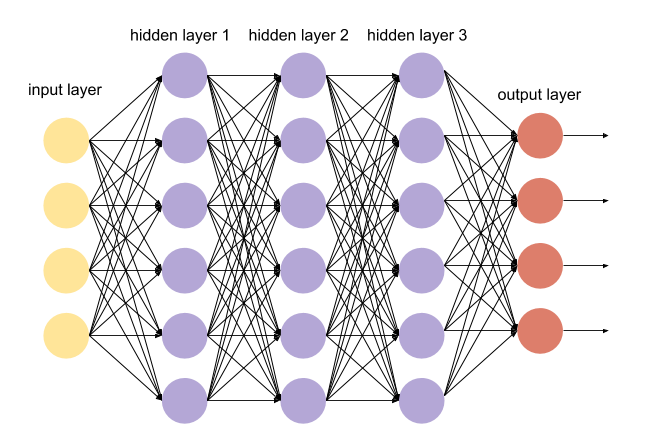

(source: https://github.com/drewnoff/spark-notebook-ml-labs/tree/master/labs/DLFramework)


### 6.1 Prepare data (X, y)

In [91]:
import keras

# standardize name (X, y) 
X_train = BOW_500.transform(train_df['text'])
y_train = train_df['emotion']

X_test = BOW_500.transform(test_df['text'])
y_test = test_df['emotion']

## check dimension is a good habbit 
print('X_train.shape: ', X_train.shape)
print('y_train.shape: ', y_train.shape)
print('X_test.shape: ', X_test.shape)
print('y_test.shape: ', y_test.shape)

X_train.shape:  (3613, 500)
y_train.shape:  (3613,)
X_test.shape:  (347, 500)
y_test.shape:  (347,)


In [92]:
import keras

In [93]:
BOW_500.transform(test_df['text'])

<347x500 sparse matrix of type '<class 'numpy.int64'>'
	with 4103 stored elements in Compressed Sparse Row format>

### 6.2 Deal with categorical label (y)

Rather than put your label `train_df['emotion']` directly into a model, we have to process these categorical (or say nominal) label by ourselves. 

Here, we use the basic method [one-hot encoding](https://en.wikipedia.org/wiki/One-hot) to transform our categorical  labels to numerical ones.


In [94]:
## deal with label (string -> one-hot)

from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
label_encoder.fit(y_train)
print('check label: ', label_encoder.classes_)
print('\n## Before convert')
print('y_train[0:4]:\n', y_train[0:4])
print('\ny_train.shape: ', y_train.shape)
print('y_test.shape: ', y_test.shape)

def label_encode(le, labels):
    enc = le.transform(labels)
    return keras.utils.to_categorical(enc)

def label_decode(le, one_hot_label):
    dec = np.argmax(one_hot_label, axis=1)
    return le.inverse_transform(dec)

y_train = label_encode(label_encoder, y_train)
y_test = label_encode(label_encoder, y_test)

print('\n\n## After convert')
print('y_train[0:4]:\n', y_train[0:4])
print('\ny_train.shape: ', y_train.shape)
print('y_test.shape: ', y_test.shape)


check label:  ['anger' 'fear' 'joy' 'sadness']

## Before convert
y_train[0:4]:
 2057      joy
2026      joy
1019     fear
421     anger
Name: emotion, dtype: object

y_train.shape:  (3613,)
y_test.shape:  (347,)


## After convert
y_train[0:4]:
 [[0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]]

y_train.shape:  (3613, 4)
y_test.shape:  (347, 4)


### 6.3 Build model

In [95]:
# I/O check
input_shape = X_train.shape[1]
print('input_shape: ', input_shape)

output_shape = len(label_encoder.classes_)
print('output_shape: ', output_shape)

input_shape:  500
output_shape:  4


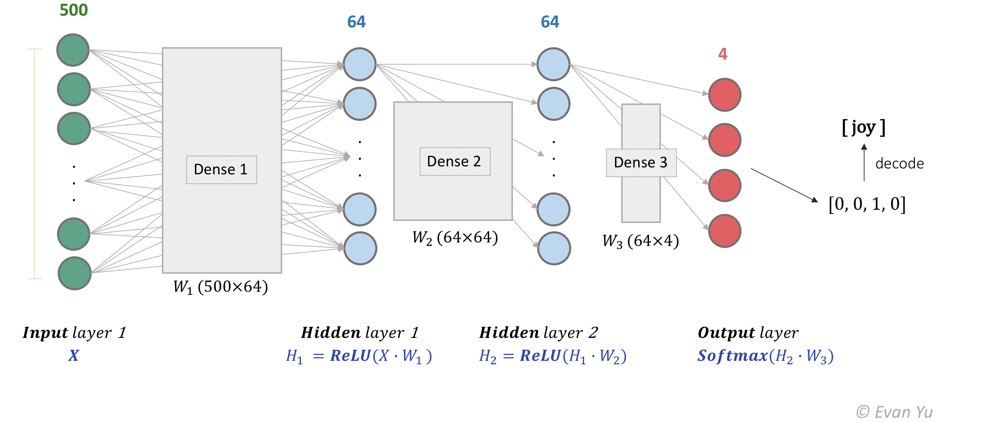

In [96]:
from keras.models import Model
from keras.layers import Input, Dense
from keras.layers import ReLU, Softmax

# input layer
model_input = Input(shape=(input_shape, ))  # 500
X = model_input

# 1st hidden layer
X_W1 = Dense(units=64)(X)  # 64
H1 = ReLU()(X_W1)

# 2nd hidden layer
H1_W2 = Dense(units=64)(H1)  # 64
H2 = ReLU()(H1_W2)

# output layer
H2_W3 = Dense(units=output_shape)(H2)  # 4
H3 = Softmax()(H2_W3)

model_output = H3

# create model
model = Model(inputs=[model_input], outputs=[model_output])

# loss function & optimizer
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# show model construction
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 500)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 64)                  │          32,064 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_4 (ReLU)                       │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_5 (ReLU)                       │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 4)                   │             260 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ softmax_2 (Softmax)                  │ (None, 4)                   │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 36,484 (142.52 KB)

 Trainable params: 36,484 (142.52 KB)

 Non-trainable params: 0 (0.00 B)

### 6.4 Train

In [97]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('logs/training_log.csv')

# training setting
epochs = 25
batch_size = 32

# training!
history = model.fit(X_train, y_train, 
                    epochs=epochs, 
                    batch_size=batch_size, 
                    callbacks=[csv_logger],
                    validation_data = (X_test, y_test))
print('training finish')

Epoch 1/25


C:\Users\Capybara\anaconda3\envs\NTUclass\lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_14']
Received: inputs=Tensor(shape=(None, 500))
  warnings.warn(msg)


113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3171 - loss: 1.3625 - val_accuracy: 0.4611 - val_loss: 1.2848
Epoch 2/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5940 - loss: 1.0872 - val_accuracy: 0.6340 - val_loss: 0.9709
Epoch 3/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7923 - loss: 0.6239 - val_accuracy: 0.6945 - val_loss: 0.8062
Epoch 4/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8521 - loss: 0.4136 - val_accuracy: 0.6888 - val_loss: 0.7839
Epoch 5/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8887 - loss: 0.3244 - val_accuracy: 0.6916 - val_loss: 0.8174
Epoch 6/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9209 - loss: 0.2489 - val_accuracy: 0.7003 - val_loss: 0.8922
Epoch 7/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9366 - loss: 0.2033 - val_accuracy: 0.6916 - val_loss: 0.9435
Epoch 8/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9502 - loss: 0.1702 - val_accuracy: 0.6916 - val_

### 6.5 Predict on testing data

In [98]:
## predict
pred_result = model.predict(X_test, batch_size=128)
pred_result[:5]

1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/stepWARNING:tensorflow:6 out of the last 9 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x0000022B8FB8F790> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


C:\Users\Capybara\anaconda3\envs\NTUclass\lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_14']
Received: inputs=Tensor(shape=(128, 500))
  warnings.warn(msg)


array([[4.06443268e-01, 2.67141104e-01, 6.06971327e-04, 3.25808644e-01],
       [3.18531423e-10, 1.16310162e-08, 9.99999881e-01, 1.04702011e-07],
       [2.71653944e-09, 9.99992609e-01, 6.86863041e-06, 5.19469438e-07],
       [1.04837696e-07, 8.55456114e-01, 5.29121943e-02, 9.16315988e-02],
       [4.99441530e-11, 1.00000000e+00, 4.89138969e-08, 1.23237598e-08]],
      dtype=float32)

In [99]:
pred_result = label_decode(label_encoder, pred_result)
pred_result[:5]

array(['anger', 'joy', 'fear', 'fear', 'fear'], dtype=object)

In [100]:
from sklearn.metrics import accuracy_score

print('testing accuracy: {}'.format(round(accuracy_score(label_decode(label_encoder, y_test), pred_result), 2)))

testing accuracy: 0.67


In [101]:
#Let's take a look at the training log
training_log = pd.DataFrame()
training_log = pd.read_csv("logs/training_log.csv")
training_log

,epoch,accuracy,loss,val_accuracy,val_loss
0,0,0.368945,1.325175,0.461095,1.284822
1,1,0.635206,0.994359,0.634006,0.970936
2,2,0.791032,0.599128,0.694524,0.806169
3,3,0.849433,0.413218,0.688761,0.783924
4,4,0.883200,0.325923,0.691643,0.817387
5,5,0.916136,0.261395,0.700288,0.892225
6,6,0.926654,0.213383,0.691643,0.943533
7,7,0.941323,0.181041,0.691643,0.981800
8,8,0.947966,0.154658,0.677233,1.067682
9,9,0.961805,0.132487,0.657061,1.143995


---
### ** >>> Exercise 6 (Take home): **  

Plot the Training and Validation Accuracy and Loss (different plots), just like the images below.(Note: the pictures below are an example from a different model). How to interpret the graphs you got? How are they related to the concept of overfitting/underfitting covered in class?

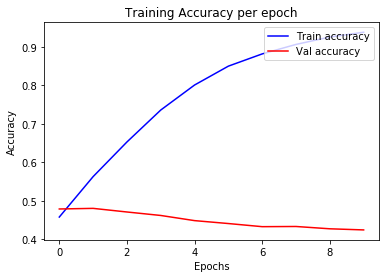


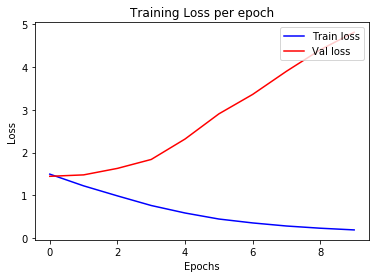

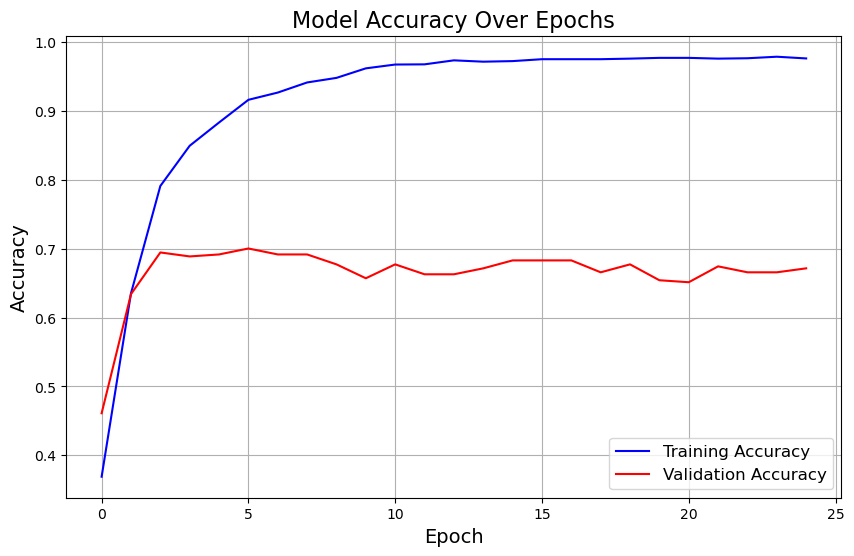

In [102]:
import pandas as pd
import matplotlib.pyplot as plt

training_log = pd.read_csv("logs/training_log.csv")

plt.figure(figsize=(10, 6))


plt.plot(training_log['epoch'], training_log['accuracy'], label='Training Accuracy', color='blue', linestyle='-')
plt.plot(training_log['epoch'], training_log['val_accuracy'], label='Validation Accuracy', color='red', linestyle='-')

plt.title('Model Accuracy Over Epochs', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.legend(loc='lower right', fontsize=12)
plt.grid(True)


plt.show()


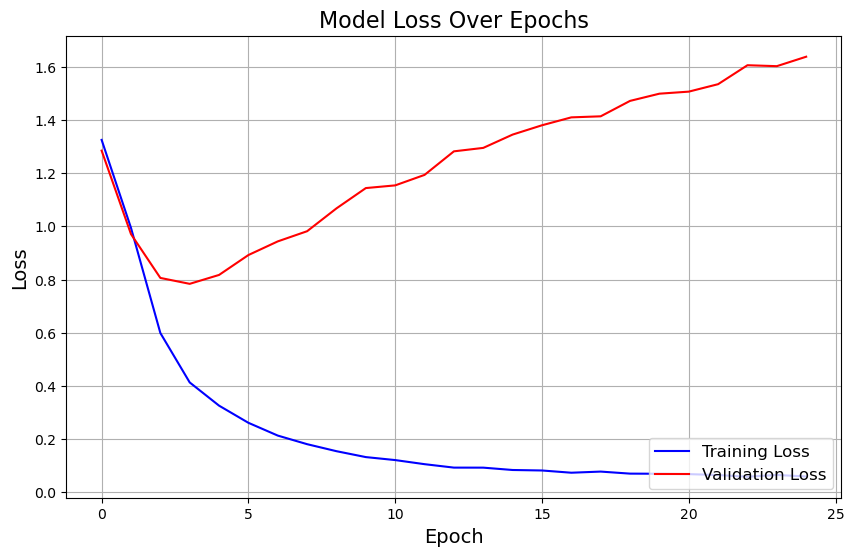

In [103]:
import pandas as pd
import matplotlib.pyplot as plt

training_log = pd.read_csv("logs/training_log.csv")

plt.figure(figsize=(10, 6))

plt.plot(training_log['epoch'], training_log['loss'], label='Training Loss', color='blue', linestyle='-')
plt.plot(training_log['epoch'], training_log['val_loss'], label='Validation Loss', color='red', linestyle='-')

plt.title('Model Loss Over Epochs', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.legend(loc='lower right', fontsize=12)
plt.grid(True)

plt.show()


#### <font color=blue><b>Analyze</b></font> 
1. Training Performance  
   - Training accuracy improves rapidly and approaches 1, indicating excellent performance on training data.
   - Training loss steadily decreases and nears 0 as epochs increase.
2. Validation Performance
   - Validation accuracy stabilizes around 70% after an initial increase, showing a significant gap compared to training accuracy.
   - Validation loss decreases initially but starts to rise, indicating reduced generalization ability.
3. Problem Analysis
   - The discrepancy between training and validation performance suggests overfitting, where the model learns too much from the training data and struggles to generalize.

---

### Note

If you don't have a GPU (level is higher than GTX 1060) or you are not good at setting lots of things about computer, we recommend you to use the [kaggle kernel](https://www.kaggle.com/kernels) to do deep learning model training. They have already installed all the librarys and provided free GPU for you to use.

Note however that you will only be able to run a kernel for 6 hours. After 6 hours of inactivity, your Kaggle kernel will shut down (meaning if your model takes more than 6 hours to train, you can't train it at once).


### More Information for your reference

* Keras document: https://keras.io/
* Keras GitHub example: https://github.com/keras-team/keras/tree/master/examples
* CS229: Machine Learning: http://cs229.stanford.edu/syllabus.html
* Deep Learning cheatsheet: https://stanford.edu/~shervine/teaching/cs-229/cheatsheet-deep-learning
* If you want to try TensorFlow or PyTorch: https://pytorch.org/tutorials/
https://www.tensorflow.org/tutorials/quickstart/beginner

---
## 7. Word2Vector

We will introduce how to use `gensim` to train your word2vec model and how to load a pre-trained model.

https://radimrehurek.com/gensim/index.html

### 7.1 Prepare training corpus

In [54]:
## check library
import gensim

## ignore warnings
import warnings
warnings.filterwarnings('ignore')

# # if you want to see the training messages, you can use it
# import logging
# logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

## the input type
train_df['text_tokenized'] = train_df['text'].apply(lambda x: nltk.word_tokenize(x))
train_df[['id', 'text', 'text_tokenized']].head()

,id,text,text_tokenized
2018,30014,😱 @cailamarsai you've had me 😂 😂 the whole tim...,"[😱, @, cailamarsai, you, 've, had, me, 😂, 😂, t..."
2296,30292,Watch this amazing live.ly broadcast by @footb...,"[Watch, this, amazing, live.ly, broadcast, by,..."
29,10029,I get so angry at people that don't know that ...,"[I, get, so, angry, at, people, that, do, n't,..."
648,10648,Gotta wonder why Caller Max listens to the sho...,"[Got, ta, wonder, why, Caller, Max, listens, t..."
2235,30231,Ryan Gosling and Eva Mendes finally ; B joyfu...,"[Ryan, Gosling, and, Eva, Mendes, finally, ;, ..."


In [55]:
## create the training corpus
training_corpus = train_df['text_tokenized'].values
training_corpus[:3]

array([list(['😱', '@', 'cailamarsai', 'you', "'ve", 'had', 'me', '😂', '😂', 'the', 'whole', 'time', 'watching', '@', 'black_ishABC', 'after', 'you', "'ve", 'lost', 'your', '#', 'glasses', '!', 'It', 'was', '#', 'hilarious', '!', '@', 'mrbabyboogaloo']),
       list(['Watch', 'this', 'amazing', 'live.ly', 'broadcast', 'by', '@', 'footballrocks123456', '#', 'musically']),
       list(['I', 'get', 'so', 'angry', 'at', 'people', 'that', 'do', "n't", 'know', 'that', 'you', 'do', "n't", 'have', 'a', 'stop', 'sign', 'on', 'Francis', 'and', 'you', 'do', 'at', 'Foster', '#', 'road'])],
      dtype=object)

### 7.2 Training our model

You can try to train your own model. More details: https://radimrehurek.com/gensim/models/word2vec.html

In [56]:
from gensim.models import Word2Vec

## setting
vector_dim = 100
window_size = 5
min_count = 1
training_epochs = 20

## model
word2vec_model = Word2Vec(sentences=training_corpus, 
                          vector_size=vector_dim, window=window_size, 
                          min_count=min_count, epochs=training_epochs)

![Imgur](https://i.imgur.com/Fca3MCs.png)

### 7.3 Generating word vector (embeddings)

In [57]:
# get the corresponding vector of a word
word_vec = word2vec_model.wv['happy']
word_vec

array([ 0.33923286,  0.1390628 ,  0.39095592, -0.15190859, -0.39806432,
       -1.1352003 ,  0.70047987,  1.36193   , -0.17875412, -0.6403587 ,
       -0.41001558, -0.41057134, -0.4273096 ,  0.5223856 , -0.0964097 ,
       -0.5648919 ,  0.25295606, -0.79543257,  0.27388933, -0.9897059 ,
        0.6445666 ,  1.1443499 ,  0.36466333,  0.23114653,  0.50591767,
       -0.08007779, -0.81224865,  0.2679042 , -0.719771  ,  0.05700734,
        0.2744371 , -0.26864865,  0.30309334, -0.43385145,  0.05142442,
        0.4898209 ,  0.32883012, -0.09977394, -0.39307383, -0.5316999 ,
       -0.38059396, -0.33147755, -0.71393436, -0.04436436,  0.6852459 ,
       -0.04811079, -1.0996565 ,  0.5158354 ,  0.46704212,  0.6819577 ,
        0.08763041, -0.81910175, -0.20461744, -0.10601562, -0.58396083,
       -0.16175802,  0.27437112,  0.11070368, -0.08105608,  0.18487015,
       -0.11974223, -0.21462251,  0.5280255 ,  0.33946759, -0.66791624,
        0.6017261 ,  0.02668508,  0.669852  , -0.88683003,  0.54

In [58]:
# Get the most similar words
word = 'happy'
topn = 10
word2vec_model.wv.most_similar(word, topn=topn)

[('Be', 0.9356256127357483),
 ('Makes', 0.9282473921775818),
 ('birthday', 0.9231650233268738),
 ('help', 0.9212440252304077),
 ('blessed', 0.9183673858642578),
 ('smile', 0.9126076698303223),
 ('free', 0.9111847877502441),
 ('infuriate', 0.9080220460891724),
 ('keeping', 0.9054870009422302),
 ('cats', 0.8974966406822205)]

### 7.4 Using a pre-trained w2v model

Instead of training your own model ,you can use a model that has already been trained. Here, we see 2 ways of doing that:


#### (1) Download model by yourself

source: [GoogleNews-vectors-negative300](https://code.google.com/archive/p/word2vec/)

more details: https://radimrehurek.com/gensim/models/keyedvectors.html

In [64]:
from gensim.models import KeyedVectors

## Note: this model is very huge, this will take some time ...
model_path = "GoogleNews/GoogleNews-vectors-negative300.bin.gz"
w2v_google_model = KeyedVectors.load_word2vec_format(model_path, binary=True)
print('load ok')

w2v_google_model.most_similar('happy', topn=10)

load ok


[('glad', 0.7408890724182129),
 ('pleased', 0.6632170677185059),
 ('ecstatic', 0.6626912355422974),
 ('overjoyed', 0.6599286794662476),
 ('thrilled', 0.6514049172401428),
 ('satisfied', 0.6437949538230896),
 ('proud', 0.636042058467865),
 ('delighted', 0.627237856388092),
 ('disappointed', 0.6269949674606323),
 ('excited', 0.6247665286064148)]

#### (2) Using gensim api

Other pretrained models are available here: https://github.com/RaRe-Technologies/gensim-data

In [59]:
import gensim.downloader as api

## If you see `SSL: CERTIFICATE_VERIFY_FAILED` error, use this:
import ssl
import urllib.request
ssl._create_default_https_context = ssl._create_unverified_context

glove_twitter_25_model = api.load("glove-twitter-25")
print('load ok')

glove_twitter_25_model.most_similar('happy', topn=10)

[===========---------------------------------------] 22.4% 23.4/104.8MB downloaded

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



[=========================-------------------------] 51.4% 53.8/104.8MB downloaded

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



[=======================================-----------] 78.3% 82.1/104.8MB downloaded

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



[==================================================] 100.0% 104.8/104.8MB downloaded
load ok


[('birthday', 0.9577818512916565),
 ('thank', 0.937666654586792),
 ('welcome', 0.93361496925354),
 ('love', 0.9176183342933655),
 ('miss', 0.9164500832557678),
 ('hello', 0.9158351421356201),
 ('thanks', 0.915008544921875),
 ('merry', 0.9053249359130859),
 ('bless', 0.902732253074646),
 ('wish', 0.9013164043426514)]

### 7.5 king + woman - man = ?

Let's run one of the most famous examples for Word2Vec and compute the similarity between these 3 words:

In [65]:
w2v_google_model.most_similar(positive=['king', 'woman'], negative=['man'])

[('queen', 0.7118193507194519),
 ('monarch', 0.6189674139022827),
 ('princess', 0.5902431011199951),
 ('crown_prince', 0.5499460697174072),
 ('prince', 0.5377321839332581),
 ('kings', 0.5236844420433044),
 ('Queen_Consort', 0.5235945582389832),
 ('queens', 0.5181134343147278),
 ('sultan', 0.5098593831062317),
 ('monarchy', 0.5087411999702454)]

---
### ** >>> Exercise 7 (Take home): **  

Now, we have the word vectors, but our input data is a sequence of words (or say sentence). 
How can we utilize these "word" vectors to represent the sentence data and train our model?


#### <font color=blue><b>Answer</b></font> 
1. Average Word Vectors
    >Compute the average of all word vectors in a sentence to represent the entire sentence.
2. Concatenation of Word Vectors
    >Concatenate the word vectors of each word in a sentence into a matrix and use Convolutional Neural Networks (CNN) or Recurrent Neural Networks (RNN)(e.g., LSTM) to learn the sentence representation.
3. Attention Mechanism
    >Use an attention mechanism to calculate weights for each word in a sentence, then generate a weighted sum of word vectors as the sentence representation.
4. Pre-trained Models (e.g., BERT)
    >Use pre-trained Transformer-based language models to input the entire sentence and directly obtain its vector representation.

## 8. Clustering: k-means

Here we introduce how to use `sklearn` to do the basic **unsupervised learning** approach, k-means.    

more details: http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html


#### Basic concept

![Image](https://i.imgur.com/PEdUf54.png)

(img source: https://towardsdatascience.com/k-means-clustering-identifying-f-r-i-e-n-d-s-in-the-world-of-strangers-695537505d)

In [59]:
# clustering target
target_list = ['happy', 'fear', 'angry', 'car', 'teacher', 'computer']
print('target words: ', target_list)

# convert to word vector
X = [word2vec_model.wv[word] for word in target_list]

target words:  ['happy', 'fear', 'angry', 'car', 'teacher', 'computer']


In [60]:
from sklearn.cluster import KMeans

# we have to decide how many cluster (k) we want
k = 2

# k-means model
kmeans_model = KMeans(n_clusters=k)
kmeans_model.fit(X)

# cluster result
cluster_result = kmeans_model.labels_

# show
for i in range(len(target_list)):
    print('word: {} \t cluster: {}'.format(target_list[i], cluster_result[i]))

word: happy 	 cluster: 1
word: fear 	 cluster: 1
word: angry 	 cluster: 1
word: car 	 cluster: 0
word: teacher 	 cluster: 0
word: computer 	 cluster: 0


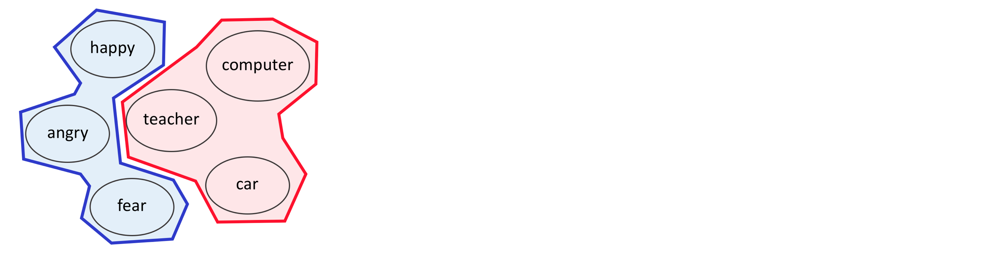

In [61]:
#check cluster membership
word = 'student'
word_vec = word2vec_model.wv[word]
kmeans_model.predict([word_vec])

array([0])

In [62]:
#check cluster membership
word = 'sad'
word_vec = word2vec_model.wv[word]
kmeans_model.predict([word_vec])

array([1])


## 9. High-dimension Visualization: t-SNE and UMAP

No matter if you use the Bag-of-words, TF-IDF, or Word2Vec, it's very hard to see the embedding result, because the dimension is larger than 3.  

In Lab 1, we already talked about PCA, t-SNE and UMAP. We can use PCA to reduce the dimension of our data, then visualize it. However, if you dig deeper into the result, you'd find it is insufficient.

Our aim will be to create a visualization similar to the one below with t-SNE:

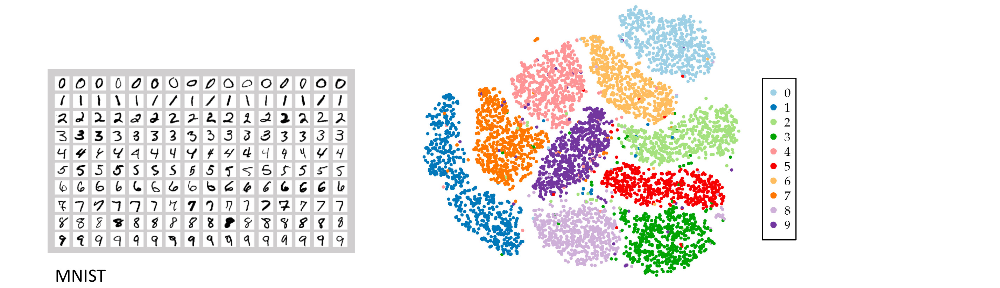

source: https://www.fabian-keller.de/research/high-dimensional-data-visualization 

And also like this for UMAP:
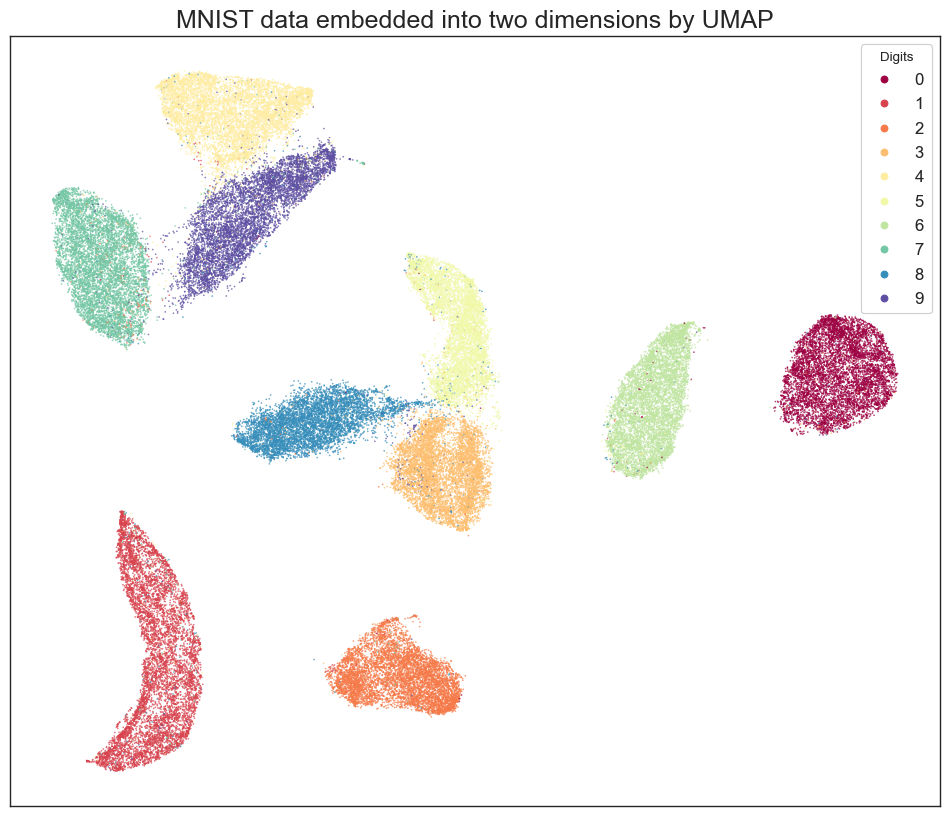

source: https://umap-learn.readthedocs.io/en/latest/auto_examples/plot_mnist_example.html

t-SNE and UMAP reference:  
http://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html 
https://umap-learn.readthedocs.io/en/latest/

### 9.1 Prepare visualizing target

Let's prepare data lists like:
- happy words
- angry words
- data words
- mining words

In [66]:
word_list = ['happy', 'angry', 'data', 'mining']

topn = 5
happy_words = ['happy'] + [word_ for word_, sim_ in w2v_google_model.most_similar('happy', topn=topn)]
angry_words = ['angry'] + [word_ for word_, sim_ in w2v_google_model.most_similar('angry', topn=topn)]        
data_words = ['data'] + [word_ for word_, sim_ in w2v_google_model.most_similar('data', topn=topn)]        
mining_words = ['mining'] + [word_ for word_, sim_ in w2v_google_model.most_similar('mining', topn=topn)]        

print('happy_words: ', happy_words)
print('angry_words: ', angry_words)
print('data_words: ', data_words)
print('mining_words: ', mining_words)

target_words = happy_words + angry_words + data_words + mining_words
print('\ntarget words: ')
print(target_words)

print('\ncolor list:')
cn = topn + 1
color = ['b'] * cn + ['g'] * cn + ['r'] * cn + ['y'] * cn
print(color)

happy_words:  ['happy', 'glad', 'pleased', 'ecstatic', 'overjoyed', 'thrilled']
angry_words:  ['angry', 'irate', 'enraged', 'indignant', 'incensed', 'annoyed']
data_words:  ['data', 'Data', 'datasets', 'dataset', 'databases', 'statistics']
mining_words:  ['mining', 'Mining', 'mines', 'coal_mining', 'mine', 'miner']

target words: 
['happy', 'glad', 'pleased', 'ecstatic', 'overjoyed', 'thrilled', 'angry', 'irate', 'enraged', 'indignant', 'incensed', 'annoyed', 'data', 'Data', 'datasets', 'dataset', 'databases', 'statistics', 'mining', 'Mining', 'mines', 'coal_mining', 'mine', 'miner']

color list:
['b', 'b', 'b', 'b', 'b', 'b', 'g', 'g', 'g', 'g', 'g', 'g', 'r', 'r', 'r', 'r', 'r', 'r', 'y', 'y', 'y', 'y', 'y', 'y']


### 9.2 Plot using t-SNE and UMAP (2-dimension)

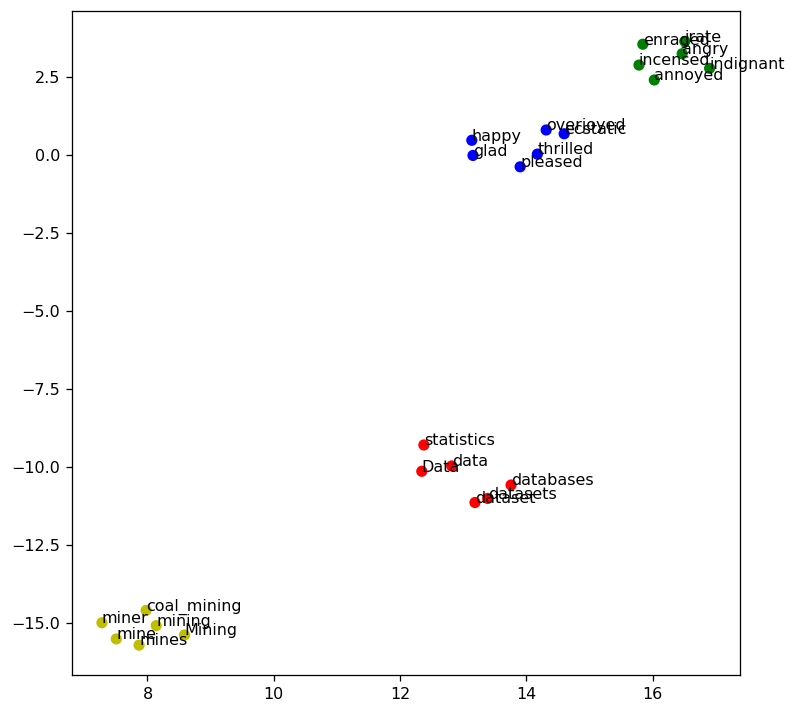

In [67]:
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

## w2v model
model = w2v_google_model

## prepare training word vectors
size = 200
target_size = len(target_words)
all_word = list(model.index_to_key)
word_train = target_words + all_word[:size]
X_train = model[word_train]

## t-SNE model
tsne = TSNE(n_components=2, metric='cosine', random_state=28)

## training
X_tsne = tsne.fit_transform(X_train)

## plot the result
plt.figure(figsize=(7.5, 7.5), dpi=115)
plt.scatter(X_tsne[:target_size, 0], X_tsne[:target_size, 1], c=color)
for label, x, y in zip(target_words, X_tsne[:target_size, 0], X_tsne[:target_size, 1]):
    plt.annotate(label, xy=(x,y), xytext=(0,0),  textcoords='offset points')
plt.show()

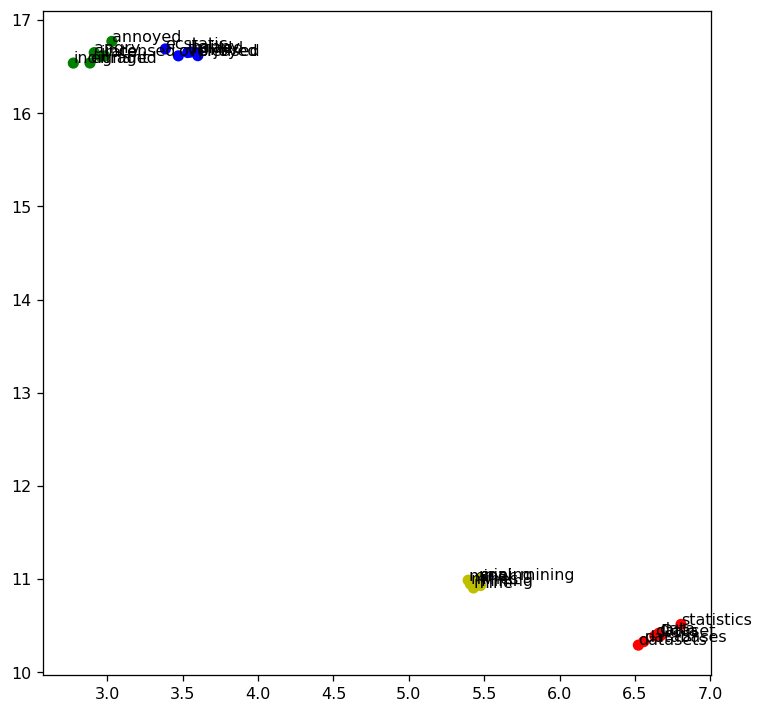

In [68]:
import matplotlib.pyplot as plt
import umap.umap_ as umap

## w2v model
model = w2v_google_model

## prepare training word vectors
size = 200
target_size = len(target_words)
all_word = list(model.index_to_key)
word_train = target_words + all_word[:size]
X_train = model[word_train]

## UMAP model
umap_model = umap.UMAP(n_components=2, metric='cosine', random_state=28)

## training
X_umap = umap_model.fit_transform(X_train)

## plot the result
plt.figure(figsize=(7.5, 7.5), dpi=115)
plt.scatter(X_umap[:target_size, 0], X_umap[:target_size, 1], c=color)
for label, x, y in zip(target_words, X_umap[:target_size, 0], X_umap[:target_size, 1]):
    plt.annotate(label, xy=(x,y), xytext=(0,0),  textcoords='offset points')
plt.show()



### ** >>> Exercise 8 (Take home): **  

Generate a t-SNE and UMAP visualization to show the 15 words most related to the words "angry", "happy", "sad", "fear" (60 words total). Compare the differences between both graphs.

In [84]:
# Answer here
word_list = ['angry', 'happy', 'sad', 'fear']

topn = 14
angry_words = ['angry'] + [word_ for word_, sim_ in w2v_google_model.most_similar('angry', topn=topn)]
happy_words = ['happy'] + [word_ for word_, sim_ in w2v_google_model.most_similar('happy', topn=topn)]        
sad_words = ['sad'] + [word_ for word_, sim_ in w2v_google_model.most_similar('sad', topn=topn)]        
fear_words = ['fear'] + [word_ for word_, sim_ in w2v_google_model.most_similar('fear', topn=topn)]    

print('happy_words: ', happy_words)
print('angry_words: ', angry_words)
print('sad_words: ', sad_words)
print('fear_words: ', fear_words)

target_words = happy_words + angry_words + sad_words + fear_words
print('\ntarget words: ')
print(target_words)

print('\ncolor list:')
cn = topn + 1
color = ['b'] * cn + ['g'] * cn + ['r'] * cn + ['y'] * cn
print(color)

happy_words:  ['happy', 'glad', 'pleased', 'ecstatic', 'overjoyed', 'thrilled', 'satisfied', 'proud', 'delighted', 'disappointed', 'excited', 'happier', 'Said_Hirschbeck', 'elated', 'thankful']
angry_words:  ['angry', 'irate', 'enraged', 'indignant', 'incensed', 'annoyed', 'agitated', 'frustrated', 'furious', 'unhappy', 'outraged', 'livid', 'irritated', 'exasperated', 'angrier']
sad_words:  ['sad', 'saddening', 'Sad', 'saddened', 'heartbreaking', 'disheartening', 'Meny_Friedman', 'parishioner_Pat_Patello', 'saddens_me', 'distressing', 'reminders_bobbing', 'Turkoman_Shiites', 'saddest', 'unfortunate', 'sorry']
fear_words:  ['fear', 'fearful', 'fears', 'Fear', 'fearing', 'worry', 'dread', 'feared', 'anxiety', 'apprehension', 'afraid', 'worries', 'concern', 'distrust', 'worried']

target words: 
['happy', 'glad', 'pleased', 'ecstatic', 'overjoyed', 'thrilled', 'satisfied', 'proud', 'delighted', 'disappointed', 'excited', 'happier', 'Said_Hirschbeck', 'elated', 'thankful', 'angry', 'irate'

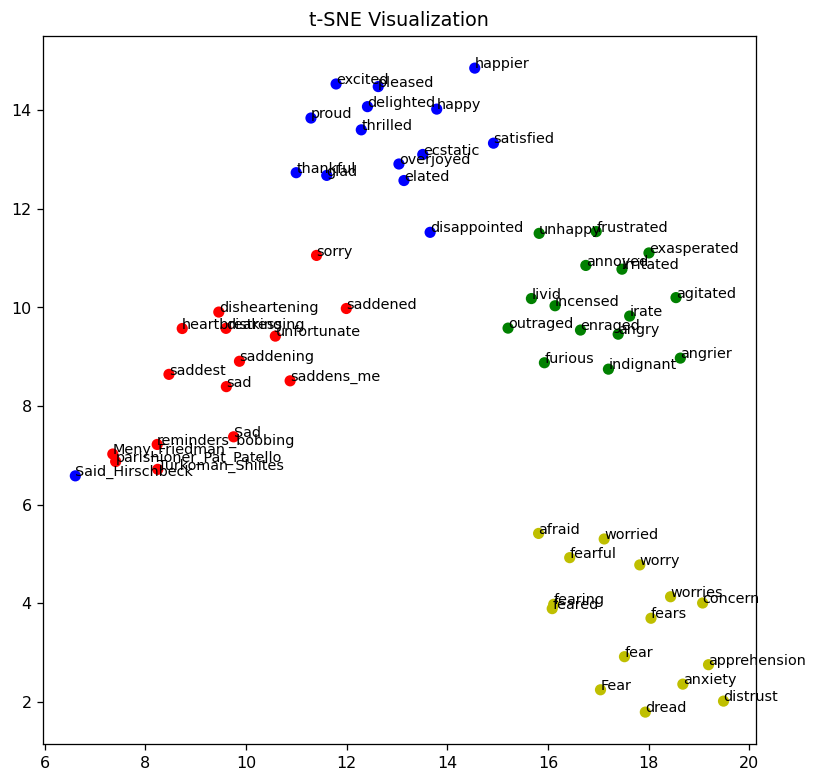

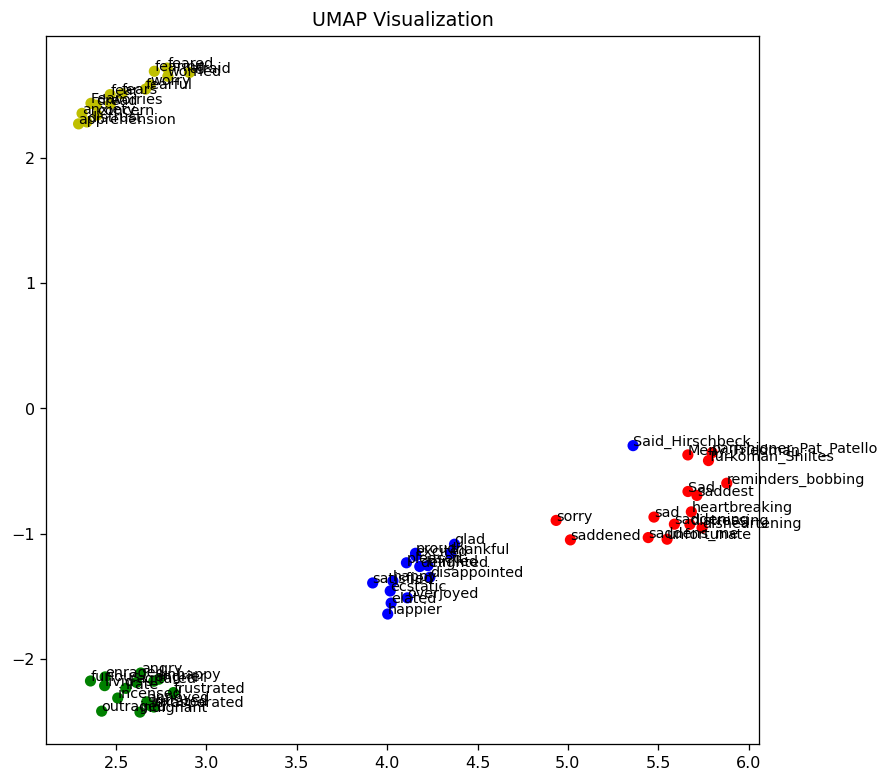

In [89]:
# 準備詞嵌入數據
size = 200  # 除目標單詞外，還選擇部分模型中的常見單詞作為參考
all_word = list(model.index_to_key)
word_train = target_words + all_word[:size]
X_train = model[word_train]

# t-SNE 視覺化
def plot_tsne(X_train, target_words, colors):
    tsne = TSNE(n_components=2, metric='cosine', random_state=28)
    X_tsne = tsne.fit_transform(X_train)
    
    plt.figure(figsize=(8, 8), dpi=115)
    plt.scatter(X_tsne[:len(target_words), 0], X_tsne[:len(target_words), 1], c=colors)
    for label, x, y in zip(target_words, X_tsne[:len(target_words), 0], X_tsne[:len(target_words), 1]):
        plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points', fontsize=9)
    plt.title("t-SNE Visualization")
    plt.show()

# UMAP 視覺化
def plot_umap(X_train, target_words, colors):
    umap_model = umap.UMAP(n_components=2, metric='cosine', random_state=28)
    X_umap = umap_model.fit_transform(X_train)
    
    plt.figure(figsize=(8, 8), dpi=115)
    plt.scatter(X_umap[:len(target_words), 0], X_umap[:len(target_words), 1], c=colors)
    for label, x, y in zip(target_words, X_umap[:len(target_words), 0], X_umap[:len(target_words), 1]):
        plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points', fontsize=9)
    plt.title("UMAP Visualization")
    plt.show()

# 執行 t-SNE 和 UMAP 可視化快樂'
plot_tsne(X_train, target_words, color)
plot_umap(X_train, target_words, color)

#### <font color=blue><b>Compare the differences between both graphs</b></font>
- t-SNE
    - The t-SNE plot distributes words related to "angry," "happy," "sad," and "fear" across a larger space.
    - Each emotion's words (e.g., blue for "happy," red for "sad") form distinct clusters with relatively large distances between them, highlighting semantic differences.

- UMAP
    - The UMAP plot shows a more compact arrangement of clusters, also grouped by emotions.
    - The clusters of words are more compact compared to t-SNE, potentially revealing latent connections between emotion groups.

<hr>

## 10. Large Language Models (LLMs)
Large Language Models (LLMs) are AI models trained on vast text data to understand and generate human language. Models like GPT and BERT excel at tasks like translation, summarization, and sentiment analysis due to their deep learning techniques and large-scale training. Recently these models got popular with the rise of Open-AI's ChatGPT and their different models, showcasing the potential of these models in a lot of aspects of our current society.

Open-source LLMs are cost-effective and customizable, with strong community support, but may underperform compared to paid models and require technical expertise to manage. Paid LLMs offer superior performance, ease of use, and regular updates, but are costly, less flexible, and create dependency on external providers for ongoing access and updates.

#### Open Source LLMs: 
In this lab we are going to use Ollama ([Ollama GitHub Link](https://github.com/ollama/ollama)), that is a library that let us use a long list of open-source LLMs of differing size. For this section we are going to be using **'llama3.2'** or **'llama3.2:1b'** for **text based tasks**, and **'llava-phi3'** for **multi-modal tasks** (e.g. image to text). Ollama has a great variety of models, and those can be found here: [model library](https://ollama.com/library). You are free to explore them if you want to try using them, you can check the advantages and disadvantages of each.

Or they can also be observed in here:
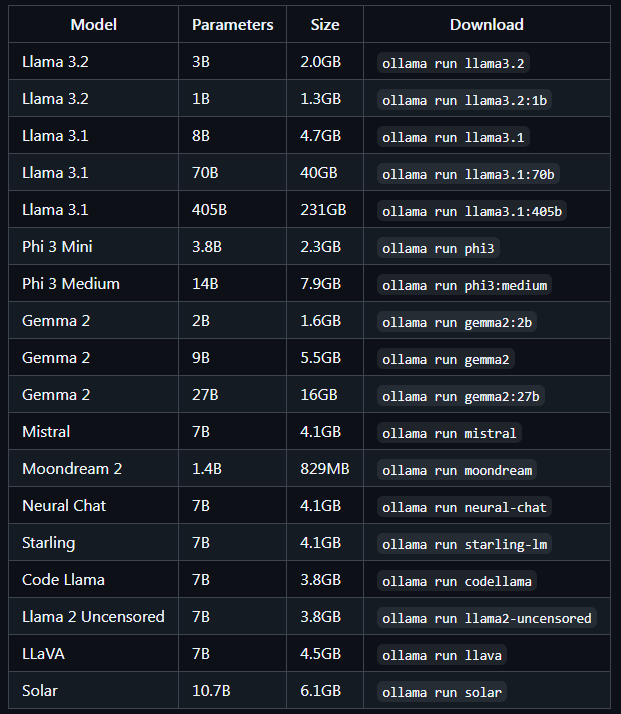

In the previous image we can observe that all LLMs have something called parameters, these are the internal weights that the model learns during training, helping it understand and generate language. The more a model has, the more complex and accurate it can be, but it also needs more memory to run.

For example:

Models with **7 billion parameters** need at least **8 GB of VRAM**.
**13 billion parameters** require **16 GB of VRAM**.
**33 billion parameters** need **32 GB of VRAM**.
The higher the number of parameters, the more memory and computational power the model needs to function efficiently.

And so that is why we are trying to use small LLMs for this practice, because they require a lot of computational resources, so by using 'llama3.2' and 'llava-phi3', both models with 3 billion parameters, we will only use at most 8 GB of VRAM. But if there are some issues with 'llama3.2' we can still use 'llama3.2:1b' the model with 1 billion parameters that requires less resources.

So now let's talk about the models: 
**LLaMA 3.2** is part of the LLaMA series (Large Language Model Meta AI), designed to provide efficient language understanding and generation. Despite having fewer parameters than some larger models, it offers strong performance in NLP tasks, making it suitable for scenarios where both accuracy and resource efficiency are important.

**LLaVA** (Large Language and Vision Assistant) models, like **LLaVA-Phi3** are multimodal models combining language and vision capabilities. It can interpret visual inputs like images and generate corresponding text, making it ideal for tasks that require both visual understanding and language generation, such as image captioning and answering visual-based questions.

**I will be using the llama3.2 model going onwards, you can change it for the smallest version if it is necessary for you, or you can try to run it on Kaggle where you can use online GPU resources for it.**

### 10.1 Text Prompting
Like with ChatGPT we can use these models to ask about anything. Here we are going to ask a question and then ask it to return it in markdown format to make it look better afterwards.

In [1]:
import ollama
response = ollama.chat(model='llama3.2', messages=[
    {
        'role': 'user',
        'content': 'What is data mining? (in markdown format)'
    },
])

print(response['message']['content'])

**Data Mining**

### Definition

Data mining is the process of automatically discovering patterns, relationships, and insights from large datasets.

### Purpose

The primary purpose of data mining is to extract valuable information or knowledge from existing data to support decision-making, improve operations, and drive business growth.

### Types of Data Mining
------------------------

*   **Descriptive Data Mining**: Focuses on summarizing and describing the characteristics of a dataset.
*   **Diagnostic Data Mining**: Aims to identify patterns that can help diagnose problems or predict future outcomes.
*   **Predictive Data Mining**: Involves using statistical models to forecast outcomes based on historical data.
*   **Prescriptive Data Mining**: Uses the insights gained from previous steps to provide recommendations for action.

### Techniques Used in Data Mining
-----------------------------------

*   **Clustering**: Grouping similar data points together.
*   **Decision Trees**:

**We can use the IPython library to make the response look better:**

In [2]:
from IPython.display import display, Markdown, Latex
display(Markdown('*some markdown* $\phi$'))

*some markdown* $\phi$

In [3]:
display(Markdown(response['message']['content']))

**Data Mining**
===============

### Definition

Data mining is the process of automatically discovering patterns, relationships, and insights from large datasets.

### Purpose

The primary purpose of data mining is to extract valuable information or knowledge from existing data to support decision-making, improve operations, and drive business growth.

### Types of Data Mining
------------------------

*   **Descriptive Data Mining**: Focuses on summarizing and describing the characteristics of a dataset.
*   **Diagnostic Data Mining**: Aims to identify patterns that can help diagnose problems or predict future outcomes.
*   **Predictive Data Mining**: Involves using statistical models to forecast outcomes based on historical data.
*   **Prescriptive Data Mining**: Uses the insights gained from previous steps to provide recommendations for action.

### Techniques Used in Data Mining
-----------------------------------

*   **Clustering**: Grouping similar data points together.
*   **Decision Trees**: Creating a tree-like model of decisions and their consequences.
*   **Neural Networks**: Using artificial neural networks to mimic human decision-making processes.
*   **Association Rule Mining**: Identifying relationships between different variables.

### Benefits
------------

*   **Improved Decision-Making**: Data mining provides insights that can inform business strategies and improve operations.
*   **Increased Efficiency**: Automating data analysis tasks saves time and resources.
*   **Enhanced Customer Insights**: Understanding customer behavior helps businesses tailor their offerings to meet needs better.

### Challenges
--------------

*   **Data Quality Issues**: Poor or missing data can lead to inaccurate insights.
*   **Scalability**: Handling large datasets can be a significant challenge.
*   **Interpretation Complexity**: Extracting meaningful insights from complex data requires expertise.


### ** >>> Exercise 9 (Take home): **  

You noticed there is a **role** parameter inside the ollama.chat function, investigate what other roles there can be inside the function and what do they do. Give an example of a prompt using another role in additional to the **user** one.

- <font size=4>user</font> 
> This is the role of the person initiating the conversation. When you pass a message with the role 'user', it simulates the user's query or request to the model.

- <font size=4>assistant</font> 
> This is the role of the AI model. When you pass a message with the role 'assistant', it simulates the model’s response to the user's input.

- <font size=4>system</font> 
> This role is used to provide context or instructions to the model that help guide its responses. The system message can be used to set the stage for the conversation, specify the tone, or provide background information.

In [104]:
from ollama import chat

response = ollama.chat(model='llama3.2', messages=[
    {"role": "system", "content": "You are a creative writing assistant."},
    {"role": "user", "content": "Help me come up with a plot for a mystery novel."},
    {"role": "assistant", "content": "Sure! How about a story where a detective investigates a series of disappearances in a small town, only to discover that the culprit is someone they least expected?"},
    {"role": "user", "content": "That sounds interesting! Can you give me more details about the detective?"},
])
print(response['message']['content'])

Let's flesh out the detective:

**Name:** August "Augie" Thompson

**Age:** Late 30s/Early 40s (let's say 38)

**Background:** Augie is a former NYPD homicide detective who left the city to escape a traumatic case that still haunts him. He now runs his own private investigation agency in the small town of Ravenswood, where everyone knows each other's secrets and the pace of life is slow.

**Personality:** Augie is a sharp, analytical mind with a dry sense of humor. He's fiercely independent and has a tendency to push people away when he gets close. Despite this, he has a soft spot for those in need and will go to great lengths to uncover the truth.

**Motivation:** When a series of disappearances rocks Ravenswood, Augie sees an opportunity to redeem himself as a detective and prove that he still has what it takes. As he delves deeper into the case, he realizes that the disappearances are linked to a larger conspiracy involving some of the town's most influential residents.

**Conflict:

<hr>

### 10.2 Multi-Modal Prompting - Text + Images
Multi-modal prompting involves using input from multiple sources or modes, such as text, images, or audio, to guide a model's response. It allows AI to process and generate information based on more than one type of input.

For image plus text prompting, the model receives both an image and a related text prompt. The image provides visual context, while the text gives additional guidance. The model uses both inputs to generate more accurate and contextually relevant responses, which is useful for tasks like image captioning, visual question answering, or content generation based on visual cues.

Let's look at the following images that are in the **pics** folder in the directory of this notebook:

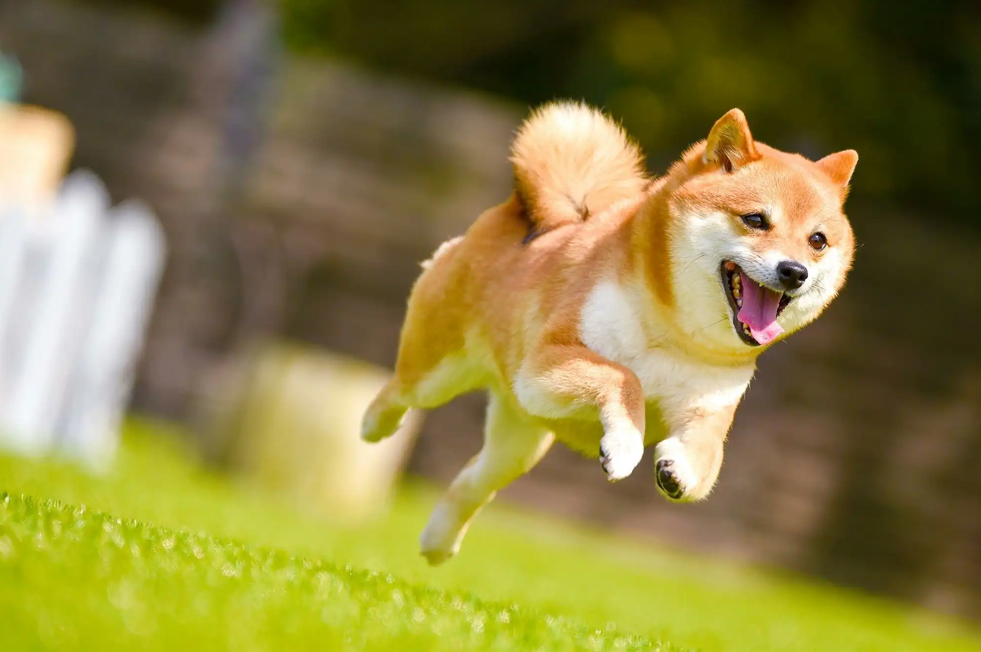


source: https://cooljapan-videos.com/tw/articles/epe0y86g

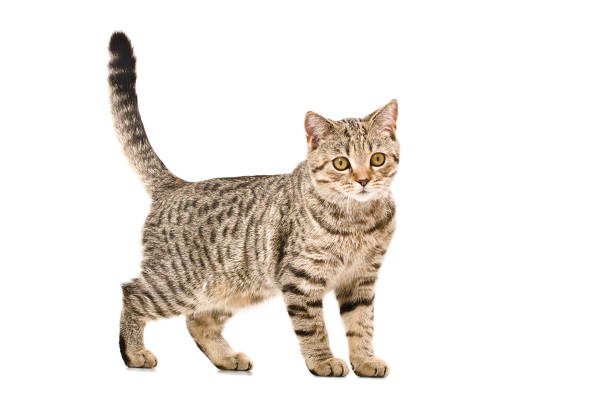


source: https://www.istockphoto.com/photo/young-cat-scottish-straight-gm1098182434-294927481

We will use the **llava-phi3** model that we installed to request a description of the images:

In [5]:
import ollama
response2 = ollama.chat(model='llava-phi3', messages=[
    {
        'role': 'user',
        'content': 'What is this image about?',
        'images': ['./pics/example1.png'] #Image with the dog
    },
])

display(Markdown(response2['message']['content']))

The image showcases a **Shiba Inu dog** in mid-air, full of energy and excitement. The dog's fur is a blend of white and tan colors, with distinctive markings on its face that give it the iconic Shiba Inu look. Its eyes are focused upwards, possibly chasing an unseen object or simply expressing joy. The tail of the dog is in mid-flip, adding to the sense of movement in the image.

The setting appears to be a grassy field or lawn, providing ample space for the dog's energetic display. In the background, there are blurred objects that could possibly be trees and buildings, suggesting an outdoor urban environment. The focus of the image is clearly on the Shiba Inu and its playful antics, with the background serving to provide context but not detract from this main subject. 

Overall, this image captures a moment of pure canine joy and energy in what could be a park or similar outdoor space within an urban setting.

In [6]:
response3 = ollama.chat(model='llava-phi3', messages=[
    {
        'role': 'user',
        'content': 'What is this image about?',
        'images': ['./pics/example2.jpg'] #Image with the cat
    },
])

display(Markdown(response3['message']['content']))

The image features a tabby cat, characterized by its distinctive gray and white striped fur. The cat stands upright on all fours against a stark white background, its tail raised high in the air. Its eyes are open wide as it gazes directly into the camera, giving an impression of alertness or curiosity. Despite being stationary, there's a sense of potential movement suggested by the positioning and stance of the cat. The image is simple yet dynamic, with the contrast between the cat's patterned fur and the white background creating a striking visual effect.


### ** >>> Exercise 10 (Take home): **  

Try asking the model with one image of your choosing. Is the description accurate? Why?

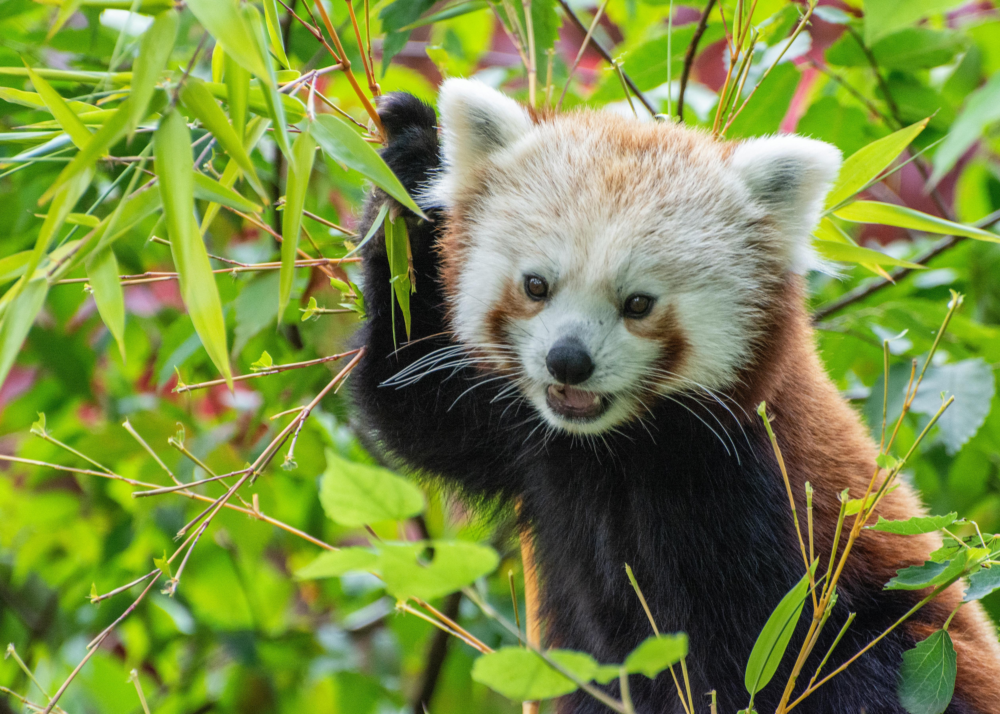

source:https://www.pexels.com/zh-tw/photo/9721941/

In [7]:
# Answer here
response_exercise = ollama.chat(model='llava-phi3', messages=[
    {
        'role': 'user',
        'content': 'What is this image about?',
        'images': ['./pics/Red_Panda.jpg'] #Image with the cat
    },
])

display(Markdown(response_exercise['message']['content']))

The image depicts a scene in nature, featuring a red panda. The red panda, with its distinctive reddish-brown fur and white facial markings, is the main subject of the photo. It's located on the left side of the frame, sitting comfortably amidst a bed of green foliage and yellow flowers.

The red panda appears to be quite content, with its black gloved hands holding up a leaf as if it were eating. Its eyes are focused directly at the camera, giving an impression of curiosity or perhaps familiarity with the photographer. The overall scene suggests that this photo was taken in a natural setting where red pandas typically reside.

Please note that this description is based on the information available in the image and does not include any assumptions or interpretations beyond what can be directly observed.

#### <font color=blue>Result Analysis</font>
> The model's interpretation of the photo is somewhat incorrect. Although it correctly identified a red panda, the red panda is actually located on the right side of the photo and is not sitting on a bed of green foliage and yellow flowers. While it is holding a branch and leaves, it is not eating.

<hr>

### 10.3 Retrieval-Augmented Generation (RAG)
RAG (Retrieval-Augmented Generation) is a technique where a language model combines document retrieval with text generation. In RAG, a retrieval system first finds relevant documents or text chunks, and then the language model uses this retrieved information to generate a more informed and accurate response. This method enhances the model's ability to answer questions by grounding its responses in real, external data.

In the following code, we will load a webpage as a document, which allows us to retrieve text from a URL. After loading the content, we will split the document into smaller, manageable chunks, making it easier for our model to process. Then, we'll generate embeddings for these chunks with a specified LLM model (e.g., Llama3.2). These embeddings will be stored in a vector database, which enables us to perform similarity searches. By setting up this retrieval system, we can use a RAG chain to answer questions. The retriever finds relevant text chunks from the document based on a query, and the LLM generates a response by incorporating this retrieved information, making the answers more grounded and accurate.

In [3]:
import ollama
import bs4
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain_community.document_loaders import WebBaseLoader
from langchain_community.vectorstores import Chroma
from langchain_community.embeddings import OllamaEmbeddings
from langchain_core.output_parsers import StrOutputParser
from langchain_core.runnables import RunnablePassthrough

llm_model = "llama3.2" #You can change to the one of your preference

# Function to load, split, and retrieve documents
def load_and_retrieve_docs(url):
    loader = WebBaseLoader(
        web_paths=(url,),
        bs_kwargs=dict() 
    ) 
    docs = loader.load() #We will load the URL that will serve as our data source
    text_splitter = RecursiveCharacterTextSplitter(chunk_size=1000, chunk_overlap=200) #We will divide the URL in chunks of text for easier comparison in the vector space
    splits = text_splitter.split_documents(docs)
    #print(splits) #You can print this to see how the chunks in the url where split
    embeddings = OllamaEmbeddings(model=llm_model) #Generating embeddings with our chosen model
    vectorstore = Chroma.from_documents(documents=splits, embedding=embeddings) #Our vector space for comparison
    return vectorstore.as_retriever()

url="https://www.ibm.com/topics/large-language-models"
# Create the retriever
retriever = load_and_retrieve_docs(url)

def format_docs(docs):
    return "\n\n".join(doc.page_content for doc in docs) #Format the retrieved docs in an orderly manner for prompting

# Define the Ollama LLM function
def ollama_llm(question, context):
    formatted_prompt = f"Question: {question}\n\nContext: {context}"
    response = ollama.chat(model='llama3.2', messages=[{'role': 'user', 'content': formatted_prompt}])
    return response['message']['content']

# Define the RAG chain
def rag_chain(question):
    retrieved_docs = retriever.invoke(question)
    formatted_context = format_docs(retrieved_docs)
    return ollama_llm(question, formatted_context)

# Use the RAG chain
result = rag_chain("What are the related solutions of IBM with LLMs?")
display(Markdown(result))

Based on the provided context, IBM's related solutions with LLMs are:

1. Watsonx.ai: A platform that hosts IBM's Granite model series, which has become the generative AI backbone for other IBM products.
2. Watsonx Assistant: An AI-powered service that leverages IBM's Granite models to provide conversational interfaces and assistance.
3. Watsonx Orchestrate: Another IBM product that utilizes the Granite models to enable AI-driven workflows and tasks.

These solutions demonstrate IBM's commitment to incorporating LLMs into its existing products and services, enhancing their natural language understanding (NLU) and processing capabilities in various business functions and use cases.


### **Actual content in the URL:**
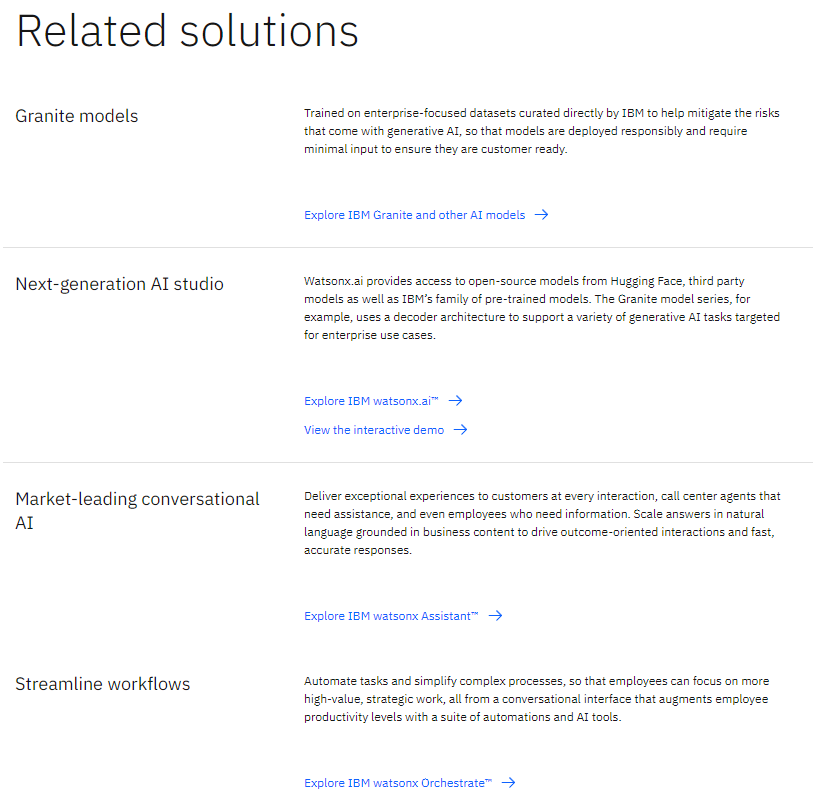

source: https://www.ibm.com/topics/large-language-models



### ** >>> Exercise 11 (Take home): **  

Try to modify the code to make it accept **three URLs**, or **three text documents** of your choosing. After modifying it, make **three prompts/questions** with information that can be found in each of the documents/urls, **compare the accuracy of the response** with the actual answer. Investigate and discuss the advantages and disadvantages of RAG systems.

In [116]:
# Answer here

llm_model = "llama3.2" 


def load_and_retrieve_docs(urls):
    all_retrievers = []
    for url in urls:
        if url.startswith("http"):
            
            loader = WebBaseLoader(web_paths=(url,))
        else:
            
            loader = LocalDocumentLoader(file_paths=(url,))  
        
        docs = loader.load()
        text_splitter = RecursiveCharacterTextSplitter(chunk_size=1000, chunk_overlap=200)
        splits = text_splitter.split_documents(docs)
        embeddings = OllamaEmbeddings(model=llm_model)
        vectorstore = Chroma.from_documents(documents=splits, embedding=embeddings)
        all_retrievers.append(vectorstore.as_retriever())
    return all_retrievers

def format_docs(docs):
    return "\n\n".join(doc.page_content for doc in docs)

def ollama_llm(question, context):
    formatted_prompt = f"Question: {question}\n\nContext: {context}"
    response = ollama.chat(model=llm_model, messages=[{'role': 'user', 'content': formatted_prompt}])
    return response['message']['content']

def rag_chain(question, retrievers):
    all_results = []
    for retriever in retrievers:
        retrieved_docs = retriever.invoke(question)
        formatted_context = format_docs(retrieved_docs)
        response = ollama_llm(question, formatted_context)
        all_results.append(response)
    return all_results

urls = [
    "https://cloud.google.com/learn/what-is-artificial-intelligence?hl=en#artificial-intelligence-defined", 
    "https://www.geeksforgeeks.org/applications-of-ai/", 
    "https://www.ibm.com/think/insights/artificial-intelligence-advantages-disadvantages#What+are+the+pros+and+cons+of+AI+%28compared+to+traditional+computing%29%3F"  
]

retrievers = load_and_retrieve_docs(urls)

questions = [
    "How does AI work?",
    "What Are The Risks of Artificial Intelligence (AI)?",
    "What are the pros and cons of AI (compared to traditional computing)?"
]

results = rag_chain(questions, retrievers)

for i, result in enumerate(results):
    print(f"Question {i + 1}: {questions[i]}")
    print(f"Answer: {result}\n")


Question 1: How does AI work?
Answer: The questions seem to be asking for an overview of the risks associated with Artificial Intelligence (AI) across various industries, as well as a general introduction to AI.

To address this, I'll provide a concise answer that covers both topics:

**What is Artificial Intelligence (AI)?**

Artificial Intelligence refers to the development of computer systems that can perform tasks that typically require human intelligence, such as learning, problem-solving, decision-making, and perception. AI systems use algorithms and data to improve their performance over time, enabling them to automate various tasks, from simple repetitive actions to complex decision-making processes.

**How does AI work?**

AI works by leveraging various techniques, including:

1. Machine Learning (ML): AI systems learn from data to improve their accuracy and performance.
2. Deep Learning: A subset of ML that uses neural networks to analyze complex data sets.
3. Natural Languag

### <font color=blue><b>Advantages and Disadvantages</b></font>
#### <b>Advantages</b>
1. Flexibility
   > The system can handle multiple data sources, whether from web URLs or local files, making it versatile for various applications.
2. Contextual Retrieval Capability
   > The RAG system effectively retrieves relevant contextual information, enabling more accurate and relevant responses, which enhances its practical utility.
#### <b>Disadvantages</b>
1. Context Limitations
   > If the retrieved content is incomplete or irrelevant, the system might fail to generate accurate answers.
2. Accuracy Depends on the Retriever
   > The accuracy of the system heavily relies on the performance of the retriever. Poor retrieval results can significantly degrade the quality of the answers.
3. Dependence on Data Quality
   > The quality of responses is highly dependent on the quality of the data sources. Incomplete or noisy data can negatively impact the retrieval and answering accuracy.

<hr>

### 10.4 Generating LLM Embeddings:
LLM embeddings are dense vector representations of text generated by Large Language Models. These embeddings, like we have already seen in the lab, capture the semantic meaning and relationships between words, phrases, or even entire documents by mapping them into a high-dimensional space where similar pieces of text are placed closer together. What makes LLM embeddings special is that they are contextual and rich in meaning, meaning the same word can have different embeddings based on its surrounding context.

For example, the word **"bank"** would have different embeddings in the sentences **"I sat by the river bank"** and **"I deposited money in the bank."** This ability to understand and encode context enables LLM embeddings to outperform traditional techniques (like TF-IDF or one-hot encoding) by providing a deeper, more nuanced representation of language.

Additionally, LLM embeddings are pre-trained on vast amounts of data, allowing them to generalize well across different tasks (like classification, clustering, or similarity detection) without the need for extensive retraining. This makes them highly valuable in many natural language processing tasks today.

**Now let's generate some embeddings with llama 3.2 for our dataset:**

In [58]:
import pandas as pd
import ollama

# Let's copy our dataframes for training and testing
df_train = train_df
df_test = test_df
# Define a function to generate embeddings
def generate_embeddings(row,text_column_name='text'):
    embeddings = ollama.embeddings(
        model='llama3.2',
        prompt=row[text_column_name],
    )
    return embeddings["embedding"]

In [59]:
# We use the text column
column_name = 'text'

# Apply the function to the specified column and store the result in a new column 'embeddings'
df_train['embeddings'] = df_train.apply(lambda row: generate_embeddings(row, column_name), axis=1)

In [60]:
df_test['embeddings'] = df_test.apply(lambda row: generate_embeddings(row, column_name), axis=1)

In [61]:
df_train #We can see the new column with the embeddings 

,id,text,emotion,intensity,embeddings
2057,30053,Food that gets delivered 😍🙌🏻 #cheering #happy,joy,0.827,"[0.9803351759910583, -0.905083417892456, 2.085..."
2026,30022,"now that I have my future planned out, I feel ...",joy,0.875,"[-1.2704169750213623, -0.5856306552886963, 2.5..."
1019,20162,onus is on Pakistan' : MEAIndia after #Uri #te...,fear,0.708,"[0.11712219566106796, -0.897064208984375, 2.00..."
421,10421,@cxmbeferre so you WOULDNT date me????? #offended,anger,0.494,"[-0.6376292705535889, -0.6726011037826538, 2.1..."
2925,40098,Tell me how I'm supposed to feel. #broken #hat...,sadness,0.729,"[-2.2133166790008545, -0.9215396642684937, 2.5..."
...,...,...,...,...,...
83,10083,Just paid for chicken at @panerabread and didn...,anger,0.729,"[1.4536560773849487, 0.9791589975357056, 1.436..."
3300,40473,An hour played and @ASFCofficial have conceded...,sadness,0.420,"[-0.5290641188621521, 1.4256495237350464, -1.1..."
1683,20826,@Gibberman10 @ScottHoward42 any of y'all remem...,fear,0.375,"[-0.49307018518447876, 1.5188168287277222, 0.3..."
1182,20325,@Ms_Asia_Pacific @jgsuing @PilosopoTanya @Huff...,fear,0.604,"[-0.19343577325344086, 1.5352659225463867, 2.5..."


In [62]:
df_test #We can see the new column with the embeddings 

,id,text,emotion,intensity,embeddings
132,21195,"At school, my classmate is with me at music cl...",fear,0.220,"[-0.42032089829444885, 1.808093547821045, -1.8..."
212,30841,I turn 25 in two weeks. I am so happy. 24 was ...,joy,0.708,"[1.6019160747528076, -2.5474958419799805, 1.76..."
184,21247,"it's horrible cos no one can relate, everyone...",fear,0.542,"[-0.37801602482795715, 0.569922149181366, 4.09..."
240,30869,Chris would take full responsibility and would...,joy,0.280,"[-0.6292338371276855, 1.3210159540176392, -1.4..."
185,21248,@CesarSampao @thisisbolton don't get me starte...,fear,0.479,"[-0.5864018797874451, 3.700843334197998, -0.08..."
...,...,...,...,...,...
235,30864,@diehimbeertonis She developed her 'forced smi...,joy,0.208,"[-1.7941440343856812, 0.08011388778686523, -2...."
274,40787,"A pessimist is someone who, when opportunity k...",sadness,0.188,"[-1.1802785396575928, 0.3302434980869293, 1.88..."
107,21170,The Apocalypse has hit our gym and it's nothi...,fear,0.583,"[-0.6743677258491516, 0.1349901705980301, 0.97..."
186,21249,@CesarSampao @thisisbolton don't get me starte...,fear,0.458,"[-0.09271539747714996, 0.2709944248199463, -0...."


Now let's train some models with these embeddings:

**KNeighborsClassifier (KNN)**: KNN is a simple, instance-based machine learning algorithm used for classification. It works by finding the 'k' nearest neighbors to a data point based on a distance metric (e.g., Euclidean distance) and assigning the most common class among those neighbors to the data point. KNN is non-parametric, meaning it doesn’t assume a specific form for the underlying data distribution, and it classifies points based on their similarity to other points in the training set. It's easy to understand and implement, though it can become computationally expensive with large datasets.

In [63]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Let's use the new Llama 3.2 embeddings as our training features and the emotions as our labels
X_train = df_train["embeddings"].tolist()
y_train = df_train['emotion']


# Initialize the KNN classifier
knn = KNeighborsClassifier(n_neighbors=10)

knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=10)

In [64]:
len(df_train["embeddings"][0]) # Llama 3.2 embedding dimension is 3072

3072

In [65]:
X_test = df_test["embeddings"].tolist()
y_test = df_test['emotion']

# Predicting the label for the test data
y_pred = knn.predict(X_test)

#Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)

print(f'KNN Accuracy: {accuracy}')

KNN Accuracy: 0.4697406340057637


In [66]:
## precision, recall, f1-score,
from sklearn.metrics import classification_report

print(classification_report(y_true=y_test, y_pred=y_pred))

              precision    recall  f1-score   support

       anger       0.41      0.45      0.43        84
        fear       0.53      0.55      0.54       110
         joy       0.44      0.43      0.44        79
     sadness       0.48      0.41      0.44        74

    accuracy                           0.47       347
   macro avg       0.47      0.46      0.46       347
weighted avg       0.47      0.47      0.47       347



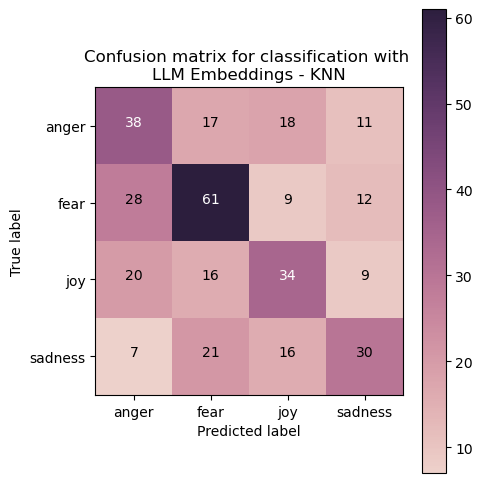

In [67]:
## check by confusion matrix
from sklearn.metrics import confusion_matrix

cm2 = confusion_matrix(y_true=y_test, y_pred=y_pred) 
my_tags = ['anger', 'fear', 'joy', 'sadness']
plot_confusion_matrix(cm2, classes=my_tags, title='Confusion matrix for classification with \nLLM Embeddings - KNN')

Now let's also try to apply our **Neural Network** to these embeddings:

In [68]:
X_llama_train = np.vstack(df_train["embeddings"].to_numpy()) #Defining our train set

In [69]:
X_llama_test = np.vstack(df_test["embeddings"].to_numpy()) #Defining our test set

In [70]:
X_llama_train.shape #(Number of data, Llama 3.2 embedding size)

(3613, 3072)

In [71]:
X_llama_test.shape #(Number of data, Llama 3.2 embedding size)

(347, 3072)

In [72]:
#One-hot encoding our labels
y_train_llama = label_encode(label_encoder, y_train)  
y_test_llama = label_encode(label_encoder, y_test)

In [73]:
# I/O check
input_shape_llama = len(X_llama_train[0])
print('input_shape: ', input_shape_llama)

output_shape = len(label_encoder.classes_)
print('output_shape: ', output_shape)

input_shape:  3072
output_shape:  4


In [74]:
#We try the same Neural Network Model Again
from keras.models import Model
from keras.layers import Input, Dense
from keras.layers import ReLU, Softmax

# input layer
model_input = Input(shape=(input_shape_llama, ))  # 3072
X = model_input

# 1st hidden layer
X_W1 = Dense(units=64)(X)  # 64
H1 = ReLU()(X_W1)

# 2nd hidden layer
H1_W2 = Dense(units=64)(H1)  # 64
H2 = ReLU()(H1_W2)

# output layer
H2_W3 = Dense(units=output_shape)(H2)  # 4
H3 = Softmax()(H2_W3)

model_output = H3

# create model
model = Model(inputs=[model_input], outputs=[model_output])

# loss function & optimizer
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# show model construction
model.summary() #We can notice that our parameter numbers went up because of the increase in the dimension of our input

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 3072)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 64)                  │         196,672 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_2 (ReLU)                       │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_3 (ReLU)                       │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 4)                   │             260 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ softmax_1 (Softmax)                  │ (None, 4)                   │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 201,092 (785.52 KB)

 Trainable params: 201,092 (785.52 KB)

 Non-trainable params: 0 (0.00 B)

In [75]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('logs/training_log_2.csv')

# training setting
epochs = 25
batch_size = 32

# training!
history = model.fit(X_llama_train, y_train_llama, 
                    epochs=epochs, 
                    batch_size=batch_size, 
                    callbacks=[csv_logger],
                    validation_data = (X_llama_test, y_test_llama))
print('training finish')

Epoch 1/25


C:\Users\Capybara\anaconda3\envs\NTUclass\lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_7']
Received: inputs=Tensor(shape=(None, 3072))
  warnings.warn(msg)


113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4102 - loss: 1.3627 - val_accuracy: 0.5303 - val_loss: 1.1345
Epoch 2/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6522 - loss: 0.8576 - val_accuracy: 0.5418 - val_loss: 1.0585
Epoch 3/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7461 - loss: 0.6599 - val_accuracy: 0.5360 - val_loss: 1.1738
Epoch 4/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7798 - loss: 0.5581 - val_accuracy: 0.5764 - val_loss: 1.2256
Epoch 5/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8577 - loss: 0.3996 - val_accuracy: 0.5677 - val_loss: 1.3298
Epoch 6/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8620 - loss: 0.3819 - val_accuracy: 0.5360 - val_loss: 1.4511
Epoch 7/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9020 - loss: 0.2771 - val_accuracy: 0.5677 - val_loss: 1.4465
Epoch 8/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9253 - loss: 0.2325 - val_accuracy: 0.5735 - val_

In [76]:
## predict
pred_result = model.predict(X_llama_test, batch_size=128)
pred_result[:5]

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


C:\Users\Capybara\anaconda3\envs\NTUclass\lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_7']
Received: inputs=Tensor(shape=(128, 3072))
  warnings.warn(msg)


array([[2.5007692e-01, 2.9635154e-02, 7.0677286e-01, 1.3515084e-02],
       [6.3072401e-03, 9.3524092e-01, 3.7834569e-05, 5.8413927e-02],
       [1.0406669e-02, 7.7469492e-01, 1.9448660e-05, 2.1487892e-01],
       [1.0588080e-01, 3.9778750e-02, 8.4669501e-01, 7.6454803e-03],
       [2.9190154e-11, 9.9999523e-01, 1.0499239e-09, 4.8246347e-06]],
      dtype=float32)

In [77]:
pred_result = label_decode(label_encoder, pred_result)
pred_result[:5]

array(['joy', 'fear', 'fear', 'joy', 'fear'], dtype=object)

In [78]:
from sklearn.metrics import accuracy_score
#Accuracy
print('testing accuracy: {}'.format(round(accuracy_score(label_decode(label_encoder, y_test_llama), pred_result), 2)))

testing accuracy: 0.56


In [79]:
#Let's take a look at the training log
training_log = pd.DataFrame()
training_log = pd.read_csv("logs/training_log_2.csv")
training_log

,epoch,accuracy,loss,val_accuracy,val_loss
0,0,0.480487,1.190471,0.530259,1.134521
1,1,0.652920,0.854496,0.541787,1.058501
2,2,0.729311,0.685308,0.536023,1.173760
3,3,0.787988,0.550163,0.576369,1.225551
4,4,0.839745,0.435173,0.567723,1.329774
5,5,0.859950,0.383872,0.536023,1.451082
6,6,0.888182,0.312063,0.567723,1.446488
7,7,0.919734,0.249348,0.573487,1.652071
8,8,0.929422,0.216314,0.582133,1.518284
9,9,0.933296,0.196721,0.550432,1.911484


In [80]:
print(classification_report(y_true=label_decode(label_encoder, y_test_llama), y_pred=pred_result))

              precision    recall  f1-score   support

       anger       0.52      0.57      0.54        84
        fear       0.55      0.68      0.61       110
         joy       0.69      0.54      0.61        79
     sadness       0.54      0.41      0.46        74

    accuracy                           0.56       347
   macro avg       0.57      0.55      0.56       347
weighted avg       0.57      0.56      0.56       347



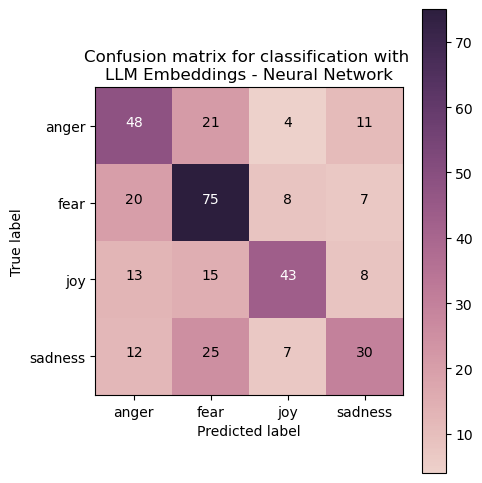

In [81]:
## check by confusion matrix
from sklearn.metrics import confusion_matrix

cm3 = confusion_matrix(y_true=label_decode(label_encoder, y_test_llama), y_pred=pred_result) 
my_tags = ['anger', 'fear', 'joy', 'sadness']
plot_confusion_matrix(cm3, classes=my_tags, title='Confusion matrix for classification with \nLLM Embeddings - Neural Network')

### ** >>> Exercise 12 (Take home): **

Follow Exercise 6 again and Plot the Training and Validation Accuracy and Loss for the results of this Neural Network. Compare the results of both KNN and the NN we just implemented. Discuss about why we obtained these results with the LLM Embeddings compared to the results of the other models implemented in this Lab.

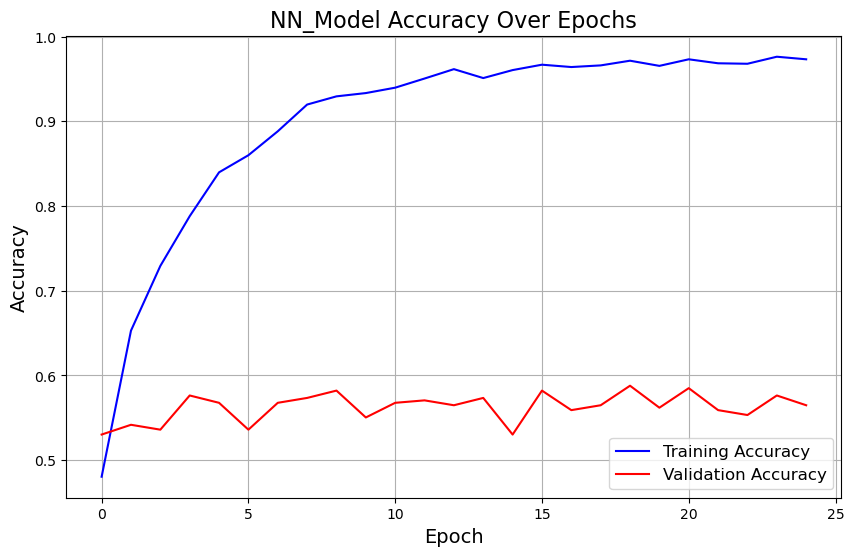

In [112]:
# Answer here
import pandas as pd
import matplotlib.pyplot as plt

training_log = pd.read_csv("logs/training_log_2.csv")

plt.figure(figsize=(10, 6))


plt.plot(training_log['epoch'], training_log['accuracy'], label='Training Accuracy', color='blue', linestyle='-')
plt.plot(training_log['epoch'], training_log['val_accuracy'], label='Validation Accuracy', color='red', linestyle='-')

plt.title('NN_Model Accuracy Over Epochs', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.legend(loc='lower right', fontsize=12)
plt.grid(True)


plt.show()

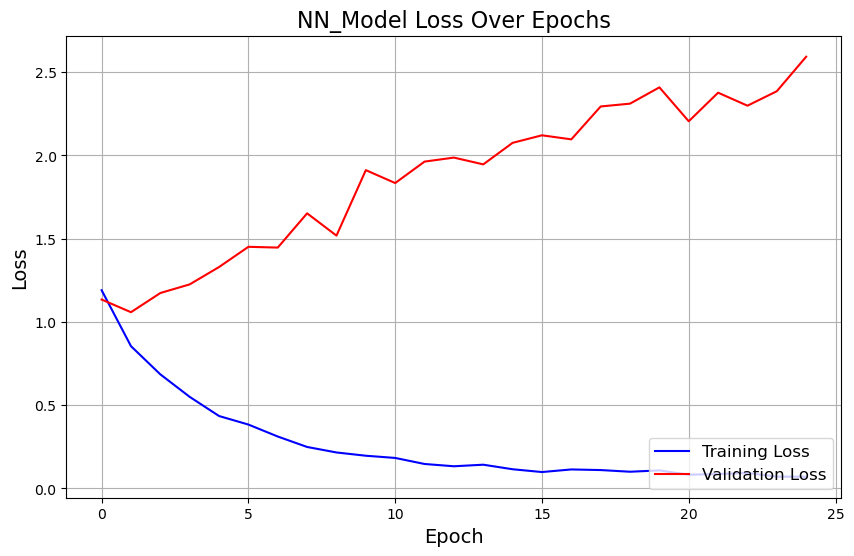

In [113]:
import pandas as pd
import matplotlib.pyplot as plt

training_log = pd.read_csv("logs/training_log_2.csv")

plt.figure(figsize=(10, 6))

plt.plot(training_log['epoch'], training_log['loss'], label='Training Loss', color='blue', linestyle='-')
plt.plot(training_log['epoch'], training_log['val_loss'], label='Validation Loss', color='red', linestyle='-')

plt.title('NN_Model Loss Over Epochs', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.legend(loc='lower right', fontsize=12)
plt.grid(True)

plt.show()


#### <font color=blue>Results Comparison</font>
1. Accuracy:
    - The accuracy of KNN is 46.97%.
    - The accuracy of NN is 56%, which is nearly 9% higher than KNN.
2. Precision, Recall, and F1-score:
    - NN outperforms KNN in precision, recall, and F1-score across all categories (anger, fear, joy, sadness).
    - Notably, for fear and joy, NN demonstrates superior performance. For example, the F1-score for fear is 0.61 in NN compared to 0.54 in KNN.
3. Confusion Matrix:
    - The confusion matrix for NN indicates more accurate classification of emotions. For example, in the fear category, NN correctly classifies 75 instances, whereas KNN only classifies 61 correctly.

- Advantages of LLM Embeddings:
> LLM Embeddings provide high-dimensional, semantically rich features that capture intricate relationships between sentences.

<hr>

### 10.5 Few-Shot Prompting Classification:
Few-shot prompting classification for LLMs involves giving the model a few labeled examples (typically 5 or fewer) within a prompt to guide it in performing a classification task. Instead of needing extensive training, the LLM uses these examples to understand the task and classify new inputs. This approach is significant in current research because it allows LLMs to perform well on tasks with minimal labeled data, reducing the need for large training datasets and making it highly flexible for various NLP tasks, including those in low-resource languages or niche domains.

In this lab exercise, we will explore zero-shot, 1-shot, and 5-shot prompting for classification using an LLM:

- Zero-shot means the model performs classification without seeing any examples beforehand.
- 1-shot provides the model with just one labeled example per class to guide its classification.
- 5-shot gives the model five labeled examples per class to improve its understanding of the task.

Since processing large datasets can be computationally demanding, we will only sample 20 test texts per emotion for the classification task, allowing us to test the model's performance more efficiently without using the entire test set.

**Process order: Explanation Prompt -> Examples + labels (if it is not zero-shot) -> Text to classify**

**Recommendation for the explanation prompt:** Explain to the model that it is a classification model of certain labels, and to only output the label word, and no other explanation. In this case if the model does not follow the instructions we are retrying the same text until it outputs one of the accepted labels for it.

In [106]:
import ollama
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, confusion_matrix

# Define the emotion labels
emotions = ['anger', 'fear', 'joy', 'sadness']
# Define the model to use for few-shot prompting
model_ollama = "llama3.2" 

# Function to sample examples per emotion category
def sample_few_shots(df, emotions, num_samples=5):
    few_shot_examples = {}
    for emotion in emotions:
        few_shot_examples[emotion] = df[df['emotion'] == emotion].sample(n=num_samples, random_state=42)
    return few_shot_examples

# Function to build the prompt based on the number of examples (few-shot, 1-shot, zero-shot)
def build_prompt(examples, emotions, num_shots=5):
    classification_instructions = """
You are an emotion classification model. You will be given a text from social media and your task is to classify the text into one of the following emotion categories: anger, fear, joy, or sadness.
You must only output one of these four labels. Do not provide any additional information or explanation. Just output the emotion label as one word.
    """
    
    prompt = classification_instructions + "\n\n"
    
    if num_shots > 0:
        prompt += f"Examples: \n"
        for emotion in emotions:
            for _, row in examples[emotion].iterrows():
                prompt += f"Text: {row['text']}\nEmotion: {emotion}\n\n" #Show the examples in the same format it will be shown for the classification text
                if num_shots == 1:  # If 1-shot, break after the first example for each emotion
                    break
    return prompt

# Function to classify using the LLM with retry for incorrect responses
def classify_with_llm(test_text, prompt_base):
    valid_emotions = ['anger', 'fear', 'joy', 'sadness']
    response = None
    while not response or response not in valid_emotions:
        full_prompt = f"{prompt_base}\nClassification:\nText: {test_text}\nEmotion: " #The classification text will leave the emotion label to be filled in by the LLM
        result = ollama.chat(model=model_ollama, messages=[
            {'role': 'user', 'content': full_prompt}
        ])
        response = result['message']['content'].strip().lower()  # Clean and standardize the response
        if response not in valid_emotions:  # Retry if not a valid response
            print(f"Invalid response: {response}. Asking for reclassification.")
    return response

# Main function to run the experiment with the option for zero-shot, 1-shot, or 5-shot prompting
def run_experiment(df_train, df_test, test_samples=5, num_shots=5):
    # Sample examples for few-shot prompting based on num_shots
    if num_shots > 0:
        few_shot_examples = sample_few_shots(df_train, emotions, num_samples=num_shots) 
        prompt_base = build_prompt(few_shot_examples, emotions, num_shots=num_shots)
    else:
        prompt_base = build_prompt(None, emotions, num_shots=0)  # Zero-shot has no examples

    # Prepare to classify the test set
    predictions = []
    true_labels = []
    print(prompt_base)
    # Sample 20 examples per emotion for the test set to classify
    test_samples = sample_few_shots(df_test, emotions, num_samples=test_samples)

    # Classify 20 test examples (5 from each category) and save predictions
    for emotion in emotions:
        for _, test_row in test_samples[emotion].iterrows():
            test_text = test_row['text']
            predicted_emotion = classify_with_llm(test_text, prompt_base)
            predictions.append(predicted_emotion)
            true_labels.append(emotion)

    # Calculate accuracy
    accuracy = accuracy_score(true_labels, predictions)
    print(f"Accuracy: {accuracy * 100:.2f}%")
    
    # Classification report
    print(classification_report(y_true=true_labels, y_pred=predictions))
    
    # Plot confusion matrix
    cm = confusion_matrix(y_true=true_labels, y_pred=predictions) 
    my_tags = ['anger', 'fear', 'joy', 'sadness']
    plot_confusion_matrix(cm, classes=my_tags, title=f'Confusion matrix for classification with \n{num_shots}-shot prompting')


You are an emotion classification model. You will be given a text from social media and your task is to classify the text into one of the following emotion categories: anger, fear, joy, or sadness.
You must only output one of these four labels. Do not provide any additional information or explanation. Just output the emotion label as one word.
    


Invalid response: frustration. Asking for reclassification.
Invalid response: angry. Asking for reclassification.
Accuracy: 50.00%
              precision    recall  f1-score   support

       anger       0.41      0.75      0.53        20
        fear       0.80      0.20      0.32        20
         joy       0.48      0.70      0.57        20
     sadness       0.78      0.35      0.48        20

    accuracy                           0.50        80
   macro avg       0.62      0.50      0.48        80
weighted avg       0.62      0.50      0.48        80



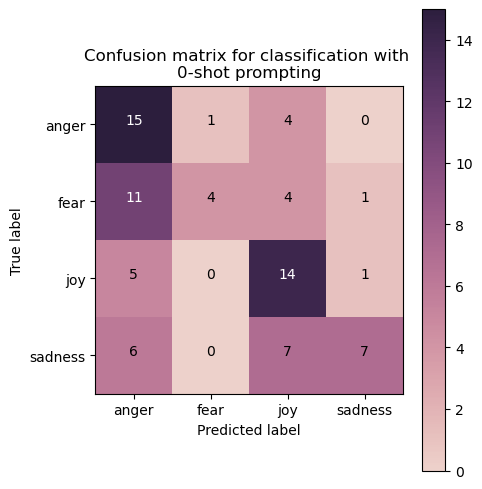

In [107]:
# Example of running the experiment with zero-shot prompting
run_experiment(df_train, df_test, test_samples=20, num_shots=0)


You are an emotion classification model. You will be given a text from social media and your task is to classify the text into one of the following emotion categories: anger, fear, joy, or sadness.
You must only output one of these four labels. Do not provide any additional information or explanation. Just output the emotion label as one word.
    

Examples: 
Text: Lost Frequencies/Janieck Devy - Reality (Gestort Aber Geil Remix)' is raging at ShoutDRIVE!
Emotion: anger

Text: both afraid of all the same things
Emotion: fear

Text: She gave a playful wink, taking the goggles off her head, swinging them around her finger. 'I would never~' @VerminEngineer
Emotion: joy

Text: @BluesfestByron second artist announcement looking good #bluesfest2017  #Music #byronbay
Emotion: sadness


Accuracy: 46.25%
              precision    recall  f1-score   support

       anger       0.38      0.85      0.52        20
        fear       1.00      0.10      0.18        20
         joy       0.54     

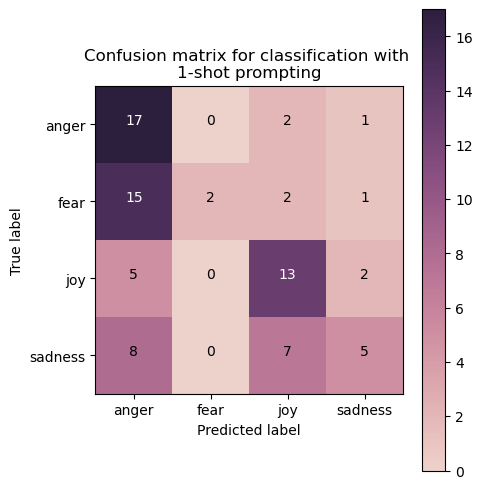

In [108]:
# Example of running the experiment with 1-shot prompting
run_experiment(df_train, df_test, test_samples=20, num_shots=1)


You are an emotion classification model. You will be given a text from social media and your task is to classify the text into one of the following emotion categories: anger, fear, joy, or sadness.
You must only output one of these four labels. Do not provide any additional information or explanation. Just output the emotion label as one word.
    

Examples: 
Text: Lost Frequencies/Janieck Devy - Reality (Gestort Aber Geil Remix)' is raging at ShoutDRIVE!
Emotion: anger

Text: When someone rudely says all women should have long hair and your inner feminist tries not to rage
Emotion: anger

Text: don't give someone power by letting their words offend you
Emotion: anger

Text: To'Why can't we brothers protect one another? No one's serious, and it makes me furious. Don't be misled, just think of Fred.' #mayfield
Emotion: anger

Text: #Hudcomedy #AdamRowe  #insult Slutfaceshlongnugget
Emotion: anger

Text: both afraid of all the same things
Emotion: fear

Text: @realDonaldTrump @Kellyann

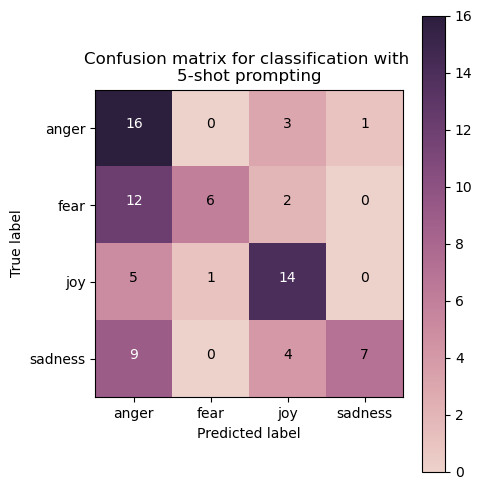

In [109]:
# Example of running the experiment with 5-shot prompting
run_experiment(df_train, df_test, test_samples=20, num_shots=5)

### ** >>> Exercise 13 (Take home): **

Compare and discuss the results of the zero-shot, 1-shot and 5-shot classification.

1. Accuracy and Macro-Averaged Metrics:
   
    - Zero-shot: The accuracy is 50%, with a macro F1-score of 0.48. The model struggles with certain categories, as seen in its poor recall for "fear" (0.20).
    - 1-shot: Accuracy drops slightly to 46.25%, and the macro F1-score falls to 0.41. While recall for "anger" improves significantly (0.85), the model performs poorly for "fear," reflecting a mismatch in prediction confidence.
    - 5-shot: The accuracy increases to 53.75%, and the macro F1-score rises to 0.53. This shows improved classification consistency due to the additional examples provided.

2. Confusion Matrix Insights:

    - Zero-shot: "Anger" and "joy" are classified relatively well, while "fear" is often misclassified as "anger." This indicates that the model’s understanding of "fear" without any prior example is minimal.
    - 1-shot: The addition of one example improves performance on "anger" but still results in significant misclassifications of "fear" as "anger" or other classes.
    - 5-shot: The confusion matrix shows notable improvement in "fear" and "joy" classifications, with fewer misclassifications across the board. The improvement is particularly prominent in "fear" due to the additional examples guiding the model's interpretation.

3. General Trends:

    - Few-shot prompting greatly benefits categories that are ambiguous (e.g., "fear" and "sadness"), as these emotions require more contextual understanding.
    - ncremental improvements are clear from zero-shot to 5-shot, but diminishing returns may occur beyond 5-shot for this small dataset.

<hr>

### 10.6 Extra LLM Materials:
So this will be it for the lab, but here are some extra materials if you would like to explore:
- How to use Gemini's LLM API from Google: [Gemini Collab](https://colab.research.google.com/github/google/generative-ai-docs/blob/main/site/en/gemini-api/docs/get-started/python.ipynb?fbclid=IwZXh0bgNhZW0CMTEAAR0-gg7cDIuaGfkeN5U3rusSNKj2jj7bIsL45sZWaM0NbTE7BSNtfzBeEGE_aem_yT5wAuL_G5E21iuuCYJXwA#scrollTo=hskqSKnJUHvp) (Free with some restrictions to the requests per minute.

- How to use OpenAI ChatGPT model's API (Not Free API): [Basics Video](https://www.youtube.com/watch?v=e9P7FLi5Zy8), [Basics GitHub](https://github.com/gkamradt/langchain-tutorials/blob/main/chatapi/ChatAPI%20%2B%20LangChain%20Basics.ipynb), [RAG's Basics Video](https://www.youtube.com/watch?v=9AXP7tCI9PI&t=300s), [RAG's Basics GitHub](https://github.com/techleadhd/chatgpt-retrieval)

- **Advanced topic - QLoRA (Quantized Low-Rank Adapter):** QLoRA is a method used to make fine-tuning large language models more efficient. It works by adding a small, trainable part (LoRA) to a pre-trained model, while keeping the rest of the model frozen. At the same time, it reduces the size of the model’s data using a process called quantization, which makes the model require less memory. This allows you to fine-tune large models without needing as much computational power, making it easier to adapt models for specific tasks. Materials: [Paper GitHub](https://github.com/artidoro/qlora?tab=readme-ov-file), [Llama 3 Application Video](https://www.youtube.com/watch?v=YJNbgusTSF0&t=512s),[Llama 3 Application GitHub](https://github.com/adidror005/youtube-videos/blob/main/LLAMA_3_Fine_Tuning_for_Sequence_Classification_Actual_Video.ipynb)

---